# Rainfall Weather Forecasting Project

In [2]:
#Importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
#Loading the dataset
df=pd.read_csv("weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
df.shape

(8425, 23)

This dataset contains 8425 rows and 23 columns.

In [5]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
df.tail(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [7]:
df.sample(15)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8362,2012-10-18,Darwin,25.4,31.3,0.6,6.8,3.8,SW,41.0,N,...,76.0,62.0,1013.6,1010.2,6.0,8.0,28.6,30.7,No,Yes
4516,2009-07-16,Wollongong,9.0,13.2,0.0,NaN,NaN,S,57.0,SW,...,61.0,59.0,1012.2,1011.1,1.0,NaN,11.0,13.0,No,Yes
4627,2010-01-20,Melbourne,14.5,28.2,0.0,6.4,10.6,SSE,39.0,NW,...,62.0,32.0,1011.4,1009.6,3.0,4.0,18.2,25.3,No,No
2997,2016-04-12,Williamtown,14.2,24.2,0.0,5.8,6.7,SSE,39.0,SSE,...,57.0,63.0,1022.1,1020.9,2.0,2.0,22.8,22.8,No,Yes
3475,2009-01-08,Wollongong,18.9,20.1,0.4,NaN,NaN,SSW,52.0,SSE,...,86.0,82.0,1013.0,1014.5,8.0,8.0,19.1,18.4,No,No
3043,2016-05-28,Williamtown,8.9,18.1,0.0,NaN,NaN,WNW,65.0,WNW,...,62.0,40.0,1008.3,1006.7,6.0,NaN,13.0,16.5,No,No
4884,2010-10-04,Melbourne,15.5,23.5,0.0,6.8,6.5,NNE,61.0,N,...,54.0,47.0,1021.8,1018.2,7.0,5.0,18.6,22.7,No,Yes
6935,2010-12-01,PerthAirport,16.4,26.9,0.0,10.6,5.8,SSW,43.0,SSW,...,56.0,44.0,1010.1,1007.5,7.0,4.0,21.4,25.5,No,No
64,2009-02-03,Albury,21.5,37.7,0.0,NaN,NaN,NaN,NaN,N,...,51.0,21.0,1009.2,1005.7,NaN,NaN,27.2,36.2,No,No
480,2010-03-26,Albury,12.6,30.0,0.0,NaN,NaN,WNW,24.0,NaN,...,80.0,32.0,1019.2,1016.4,NaN,NaN,15.8,29.1,No,No


In [8]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

Out of 23 columns, 16 columns are numerical/continous columns and 7 are categorical in nature.

In [9]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [10]:
#To see columns in a list
df.columns.to_list()

['Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow']

# Checking duplicate values

In [11]:
df.duplicated().sum()

1663

In [12]:
df[df.duplicated()]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,...,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,...,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,...,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
3677,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,...,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
3678,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,...,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6143,2012-01-25,Melbourne,20.3,25.0,0.0,11.6,7.3,S,39.0,S,...,77.0,60.0,1015.2,1014.0,8.0,2.0,20.8,23.8,No,No
6144,2012-01-26,Melbourne,16.1,24.5,0.0,4.4,12.4,S,50.0,S,...,67.0,55.0,1018.5,1016.9,NaN,NaN,18.9,23.7,No,NaN
6145,2012-01-27,Melbourne,16.6,30.7,NaN,8.0,13.0,SSE,39.0,WSW,...,69.0,55.0,1016.9,1013.5,NaN,NaN,20.5,26.3,NaN,NaN
6146,2012-01-28,Melbourne,20.0,30.4,NaN,8.2,12.1,SSE,37.0,SW,...,64.0,55.0,1012.7,1009.2,NaN,NaN,24.1,27.4,NaN,NaN


Here, we can see that 1663 duplicates found.

In [13]:
#To remove duplicates.
df.drop_duplicates(keep='last', inplace=True)

In [14]:
df.shape

(6762, 23)

In [15]:
df.duplicated().sum()

0

In [16]:
df[df.duplicated()]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow


Now, we can see that all duplicate datas have been removed.

# Checking Null values

In [17]:
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

Here, we can see that except 2 features are all having null values.

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6692 non-null   float64
 3   MaxTemp        6705 non-null   float64
 4   Rainfall       6624 non-null   float64
 5   Evaporation    3841 non-null   float64
 6   Sunshine       3526 non-null   float64
 7   WindGustDir    5820 non-null   object 
 8   WindGustSpeed  5820 non-null   float64
 9   WindDir9am     5968 non-null   object 
 10  WindDir3pm     6468 non-null   object 
 11  WindSpeed9am   6699 non-null   float64
 12  WindSpeed3pm   6662 non-null   float64
 13  Humidity9am    6708 non-null   float64
 14  Humidity3pm    6666 non-null   float64
 15  Pressure9am    5454 non-null   float64
 16  Pressure3pm    5451 non-null   float64
 17  Cloud9am       4896 non-null   float64
 18  Cloud3pm

In [19]:
#Checking missing values percentage.
print(pd.concat([df.isnull().sum(), ((df.isnull().sum())/df.shape[0])*100], axis=1, keys= ['No.of missing values', 'Prercentage of Missing values']))

               No.of missing values  Prercentage of Missing values
Date                              0                       0.000000
Location                          0                       0.000000
MinTemp                          70                       1.035197
MaxTemp                          57                       0.842946
Rainfall                        138                       2.040816
Evaporation                    2921                      43.197279
Sunshine                       3236                      47.855664
WindGustDir                     942                      13.930790
WindGustSpeed                   942                      13.930790
WindDir9am                      794                      11.742088
WindDir3pm                      294                       4.347826
WindSpeed9am                     63                       0.931677
WindSpeed3pm                    100                       1.478852
Humidity9am                      54                       0.79

We can see that, in 'Evaporation' and 'Sunshine' columns nearly 45% of values are missing.

<Axes: >

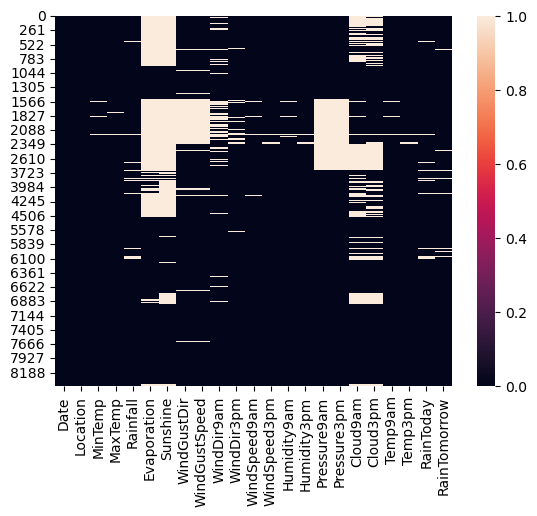

In [20]:
sns.heatmap(df.isnull())

In [21]:
for i in df.columns:
    if df[i].dtypes==object:
        print(i)
        print("---------------------")
        print(df[i].value_counts())
        print("\n")

Date
---------------------
2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64


Location
---------------------
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


WindGustDir
---------------------
E      518
SW     465
N      459
W      434
WSW    420
WNW    398
SSE    390
S      376
SE     370
ENE    357
NE     300
SSW    299
NW     296
NNE    287
ESE    267
NNW    184
Name: WindGustDir, dtype: int64


WindDir9am
---------------------
N      609
SW     590
NW     463
SE     439
ENE    397
WSW    394
SSW    368
NE     364
E      338
NNE    337
S      324
WNW    301
SSE    300
W      299
ESE    229


Filling up the null values.

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6692 non-null   float64
 3   MaxTemp        6705 non-null   float64
 4   Rainfall       6624 non-null   float64
 5   Evaporation    3841 non-null   float64
 6   Sunshine       3526 non-null   float64
 7   WindGustDir    5820 non-null   object 
 8   WindGustSpeed  5820 non-null   float64
 9   WindDir9am     5968 non-null   object 
 10  WindDir3pm     6468 non-null   object 
 11  WindSpeed9am   6699 non-null   float64
 12  WindSpeed3pm   6662 non-null   float64
 13  Humidity9am    6708 non-null   float64
 14  Humidity3pm    6666 non-null   float64
 15  Pressure9am    5454 non-null   float64
 16  Pressure3pm    5451 non-null   float64
 17  Cloud9am       4896 non-null   float64
 18  Cloud3pm

For categorial columns.

In [23]:
df["RainToday"] = df["RainToday"].fillna(df["RainToday"].mode()[0])
df["RainTomorrow"] = df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].mode()[0])
df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].mode()[0])

For Continous Columns.

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6692 non-null   float64
 3   MaxTemp        6705 non-null   float64
 4   Rainfall       6624 non-null   float64
 5   Evaporation    3841 non-null   float64
 6   Sunshine       3526 non-null   float64
 7   WindGustDir    6762 non-null   object 
 8   WindGustSpeed  5820 non-null   float64
 9   WindDir9am     6762 non-null   object 
 10  WindDir3pm     6762 non-null   object 
 11  WindSpeed9am   6699 non-null   float64
 12  WindSpeed3pm   6662 non-null   float64
 13  Humidity9am    6708 non-null   float64
 14  Humidity3pm    6666 non-null   float64
 15  Pressure9am    5454 non-null   float64
 16  Pressure3pm    5451 non-null   float64
 17  Cloud9am       4896 non-null   float64
 18  Cloud3pm

For Numerical columns

In [25]:
df["Temp3pm"] = df["Temp3pm"].fillna(df["Temp3pm"].median())
df["Temp9am"] = df["Temp9am"].fillna(df["Temp9am"].median())
df["Cloud3pm"] = df["Cloud3pm"].fillna(df["Cloud3pm"].median())
df["Cloud9am"] = df["Cloud9am"].fillna(df["Cloud9am"].median())
df["Pressure3pm"] = df["Pressure3pm"].fillna(df["Pressure3pm"].median())
df["Pressure9am"] = df["Pressure9am"].fillna(df["Pressure9am"].median())
df["Humidity3pm"] = df["Humidity3pm"].fillna(df["Humidity3pm"].median())
df["Humidity9am"] = df["Humidity9am"].fillna(df["Humidity9am"].median())
df["WindSpeed3pm"] = df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].median())
df["WindSpeed9am"] = df["WindSpeed9am"].fillna(df["WindSpeed9am"].median())
df["WindGustSpeed"] = df["WindGustSpeed"].fillna(df["WindGustSpeed"].median())
df["Sunshine"] = df["Sunshine"].fillna(df["Sunshine"].median())
df["Evaporation"] = df["Evaporation"].fillna(df["Evaporation"].median())
df["Rainfall"] = df["Rainfall"].fillna(df["Rainfall"].median())
df["MaxTemp"] = df["MaxTemp"].fillna(df["MaxTemp"].median())
df["MinTemp"] = df["MinTemp"].fillna(df["MinTemp"].median())

In [26]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

<Axes: >

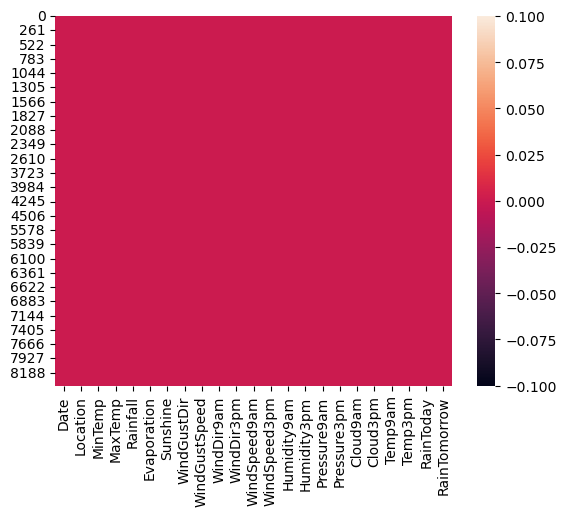

In [27]:
sns.heatmap(df.isnull())

Now, we can see that all null values has been filled.

In [28]:
#Changing Date column to datetime
df['Date'] = pd.to_datetime(df.Date)

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           6762 non-null   datetime64[ns]
 1   Location       6762 non-null   object        
 2   MinTemp        6762 non-null   float64       
 3   MaxTemp        6762 non-null   float64       
 4   Rainfall       6762 non-null   float64       
 5   Evaporation    6762 non-null   float64       
 6   Sunshine       6762 non-null   float64       
 7   WindGustDir    6762 non-null   object        
 8   WindGustSpeed  6762 non-null   float64       
 9   WindDir9am     6762 non-null   object        
 10  WindDir3pm     6762 non-null   object        
 11  WindSpeed9am   6762 non-null   float64       
 12  WindSpeed3pm   6762 non-null   float64       
 13  Humidity9am    6762 non-null   float64       
 14  Humidity3pm    6762 non-null   float64       
 15  Pressure9am    6762 n

In [30]:
#Separating Date column to Day, Month and year columns
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

In [31]:
#Now dropping Date column
df.drop(['Date'], axis=1, inplace=True)

In [32]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month', 'Day'],
      dtype='object')

In [33]:
df.shape

(6762, 25)

In [34]:
#statisdical summary of numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,6762.0,13.110086,5.540674,-2.0,9.0,13.2,17.4,28.5
MaxTemp,6762.0,24.093301,6.130367,8.2,19.6,23.5,28.4,45.5
Rainfall,6762.0,2.723410,10.490138,0.0,0.0,0.0,0.8,371.0
Evaporation,6762.0,4.998980,3.361770,0.0,4.0,4.6,5.0,145.0
Sunshine,6762.0,8.421665,2.789228,0.0,8.8,9.0,9.2,13.9
WindGustSpeed,6762.0,38.702159,13.393977,7.0,30.0,37.0,46.0,107.0
WindSpeed9am,6762.0,12.765602,9.789075,0.0,6.0,11.0,19.0,63.0
WindSpeed3pm,6762.0,17.562703,9.548883,0.0,11.0,17.0,24.0,83.0
Humidity9am,6762.0,67.510500,17.182756,10.0,56.0,68.0,80.0,100.0
Humidity3pm,6762.0,50.460515,18.498424,6.0,38.0,50.0,62.0,99.0


From the above, we can see that,
 
    1.The dataset looks perfect because it did not have any negative/invalid datas
    2.The counts are same, so missing/null values
    3.The mean and median(50%) have differences, so skewness is present.
    4.There is also huge difference between 75% and max in some columns,so outliers are present.

# Data Visualization

Univariant Analysis

No     5190
Yes    1572
Name: RainTomorrow, dtype: int64


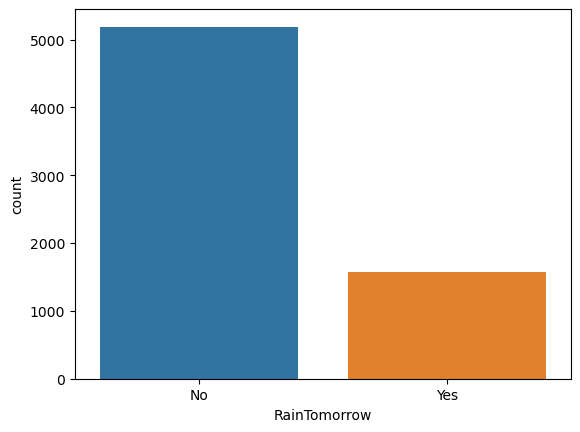

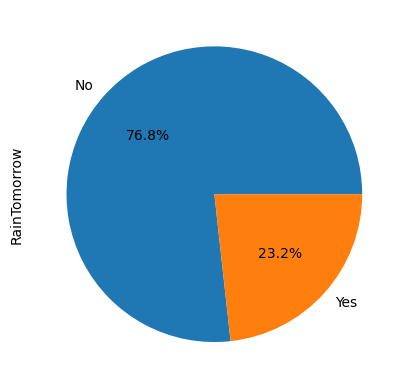

In [35]:
print(df['RainTomorrow'].value_counts())
sns.countplot(x='RainTomorrow', data =df)
plt.show()
df['RainTomorrow'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

The "RainTomorrow" column represents whether it will rain tomorrow or not. From the above graphs, we can see that target variable "RainTomorrow" has more "No" instances than "yes".

In [36]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month', 'Day'],
      dtype='object')

No     5190
Yes    1572
Name: RainToday, dtype: int64


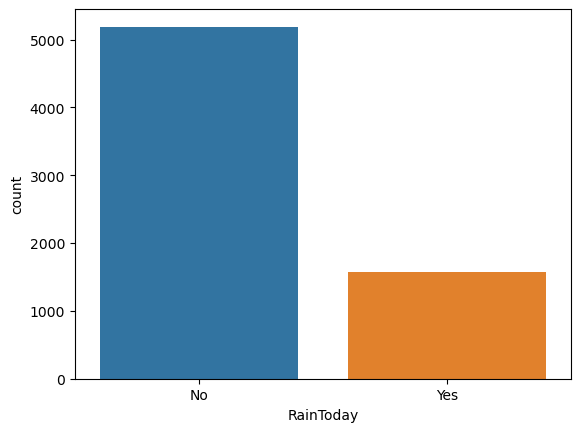

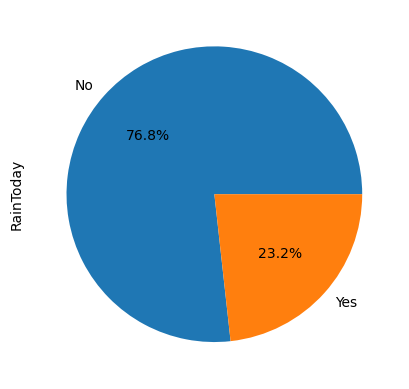

In [37]:
print(df['RainToday'].value_counts())
sns.countplot(x='RainToday', data =df)
plt.show()
df['RainToday'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

The "RainToday" column represents whether it will rain today or not. From the above graphs, we can see that column "RainToday" has more "No" instances than "yes".

PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


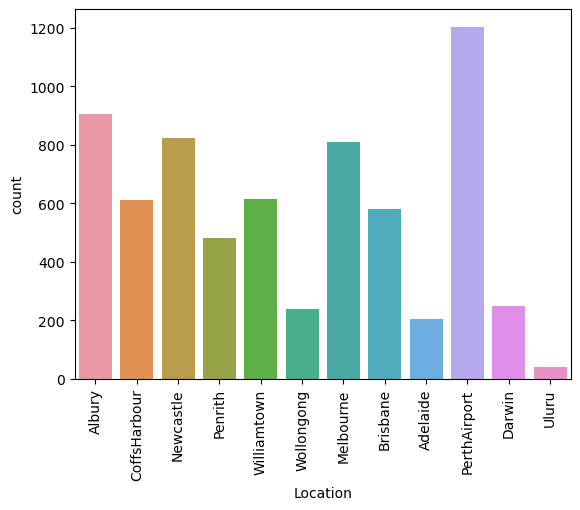

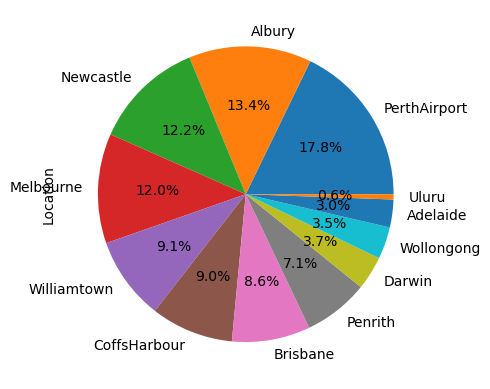

In [38]:
print(df['Location'].value_counts())
sns.countplot(x='Location', data =df)
plt.xticks(rotation=90)
plt.show()
df['Location'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

Nearly 17.8% datas are from location "PerthAirport". Major datas are from location "Albury", "Newcastle" and "Melbourne".

N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: WindDir9am, dtype: int64


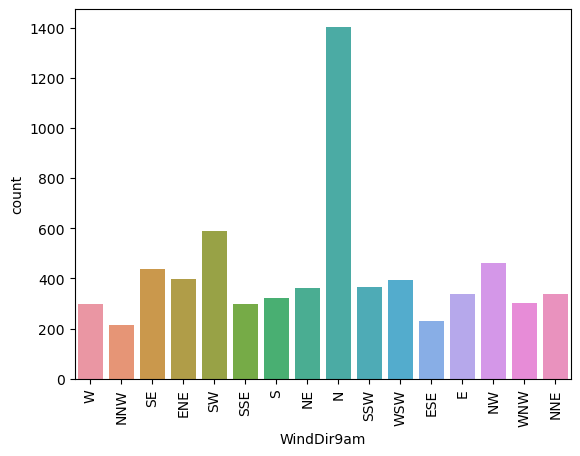

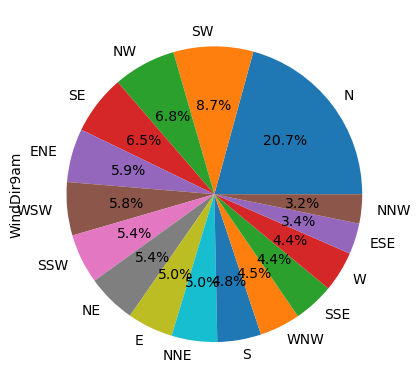

In [39]:
print(df['WindDir9am'].value_counts())
sns.countplot(x='WindDir9am', data =df)
plt.xticks(rotation=90)
plt.show()
df['WindDir9am'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

This column "WindDir9am" represents direction of wind @ 9am everyday, from the above graph we can see that most of the times it comes from North.

SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64


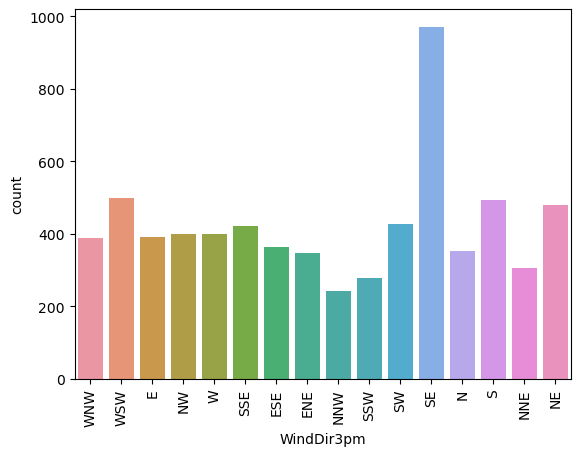

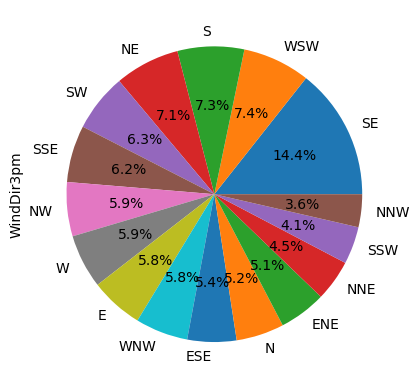

In [40]:
print(df['WindDir3pm'].value_counts())
sns.countplot(x='WindDir3pm', data =df)
plt.xticks(rotation=90)
plt.show()
df['WindDir3pm'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

This column "WindDir3pm" represents direction of wind @ 3pm everyday, from the above graph we can see that most of the times it comes from SouthEast.

E      1460
SW      465
N       459
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: WindGustDir, dtype: int64


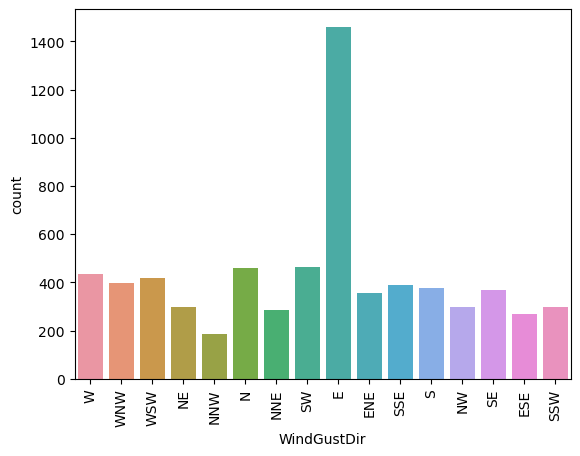

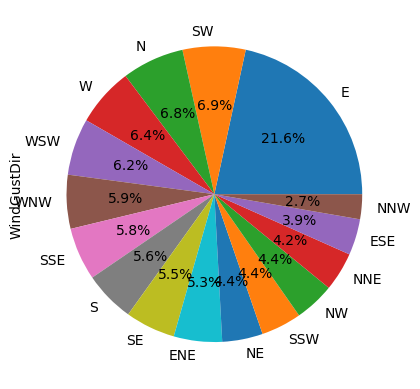

In [41]:
print(df['WindGustDir'].value_counts())
sns.countplot(x='WindGustDir', data =df)
plt.xticks(rotation=90)
plt.show()
df['WindGustDir'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

This column "WindGustDir" represents the strongest wind gust in the 24 hours, from the above graph we can see that most of the times it is East.

To see for numerical columns:

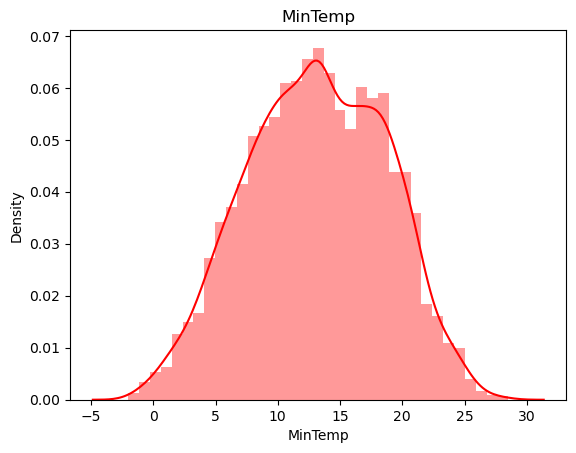

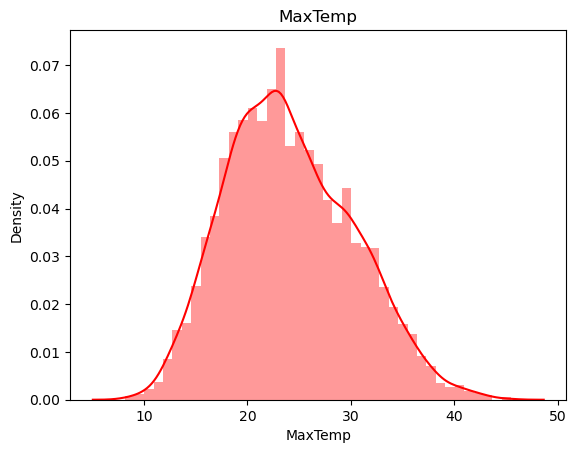

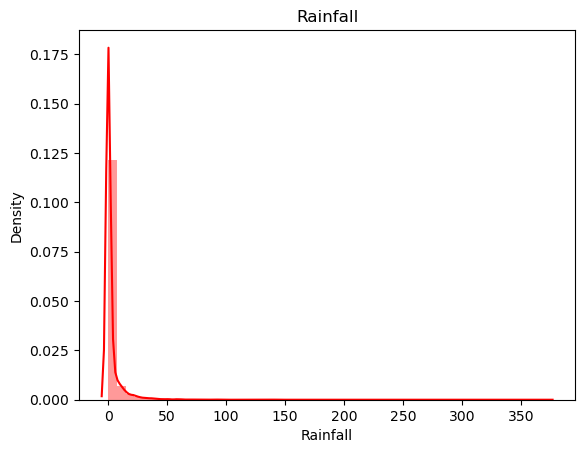

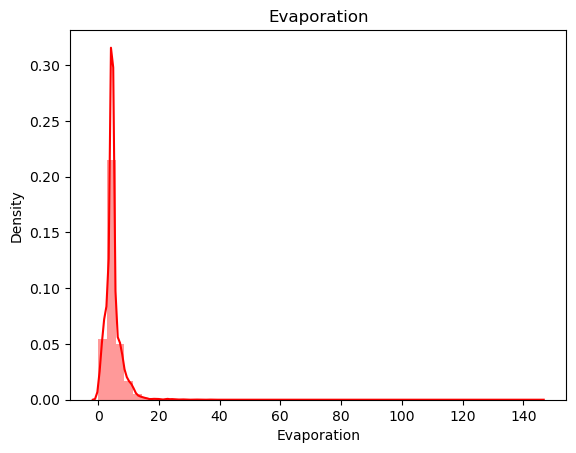

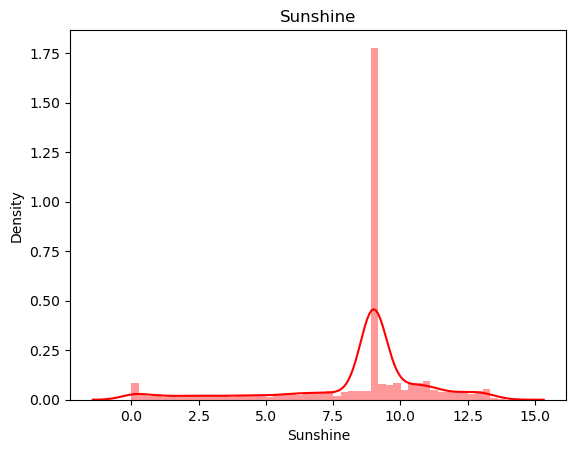

...

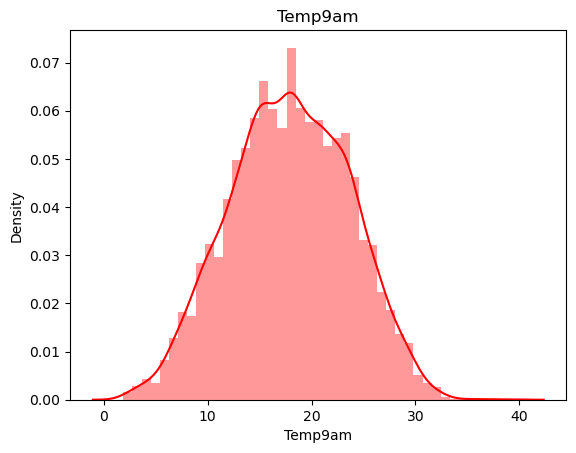

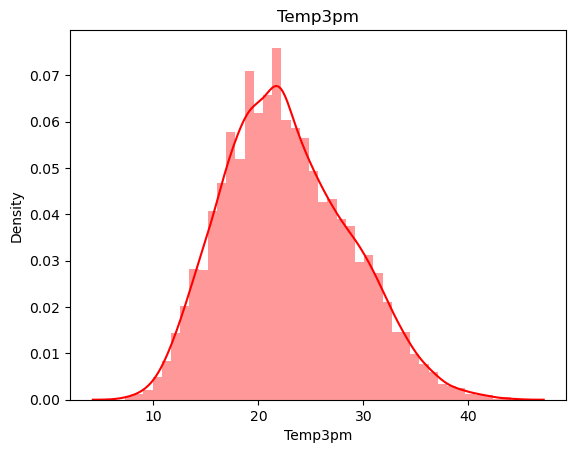

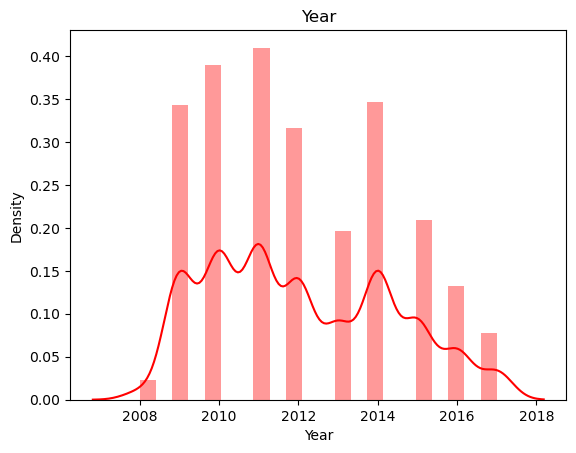

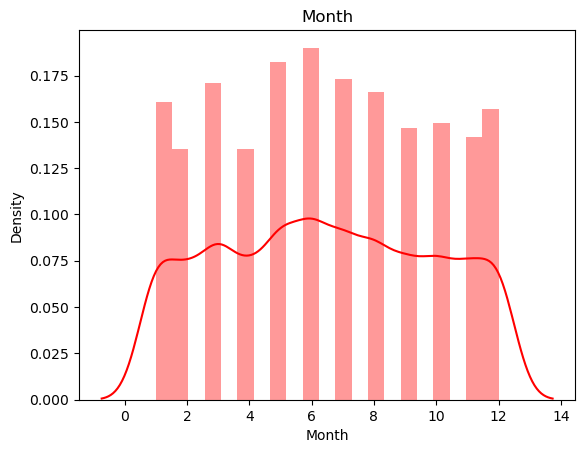

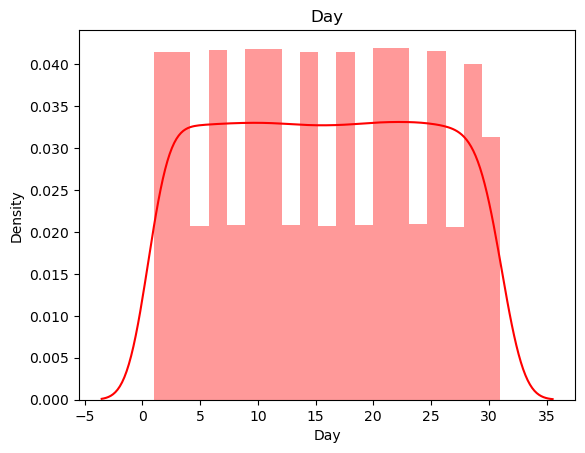

In [42]:
for i in df.columns :
    if df[i].dtypes!=object:
        sns.distplot(df[i] , kde = True , color = 'red' )
        plt.title(i)
        plt.show()

From the above graph we can see that, target variable "Rainfall" and features like "Evaporation", "Sunshine", "WindGustSpeed" ,"WindSpeed9am", "WindSpeed3pm", "Humidity9am", "Pressure9am", "Pressure3pm" have skewness in their datas.  

2011    1133
2010    1078
2014     959
2009     950
2012     876
2015     580
2013     543
2016     366
2017     215
2008      62
Name: Year, dtype: int64


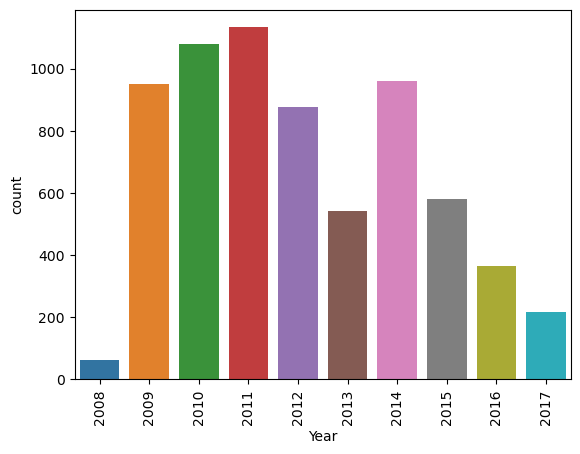

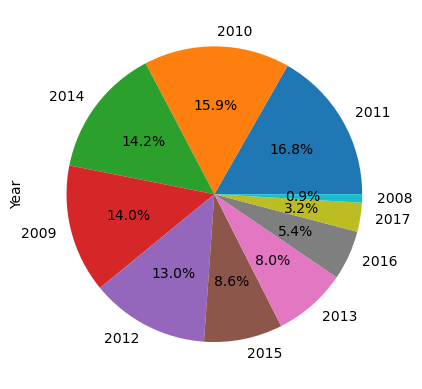

In [43]:
print(df['Year'].value_counts())
sns.countplot(x='Year', data =df)
plt.xticks(rotation=90)
plt.show()
df['Year'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

Most of the datas are from year 2009 to 2015

Bivariant Analysis

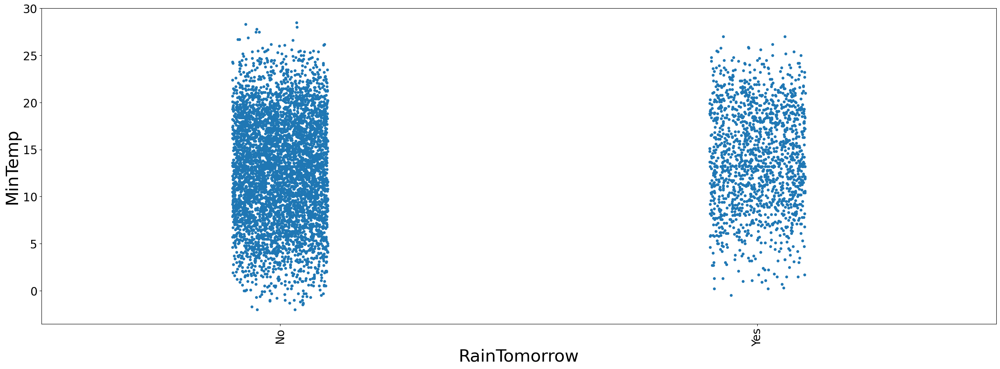

In [44]:
plt.figure(figsize = (30,10))
sns.stripplot(x='RainTomorrow', y='MinTemp', data =df)
plt.xlabel('RainTomorrow', fontsize=30)
plt.ylabel('MinTemp', fontsize=30)
plt.yticks(size=20)
plt.xticks(size=20)
plt.xticks(rotation=90)
plt.show()

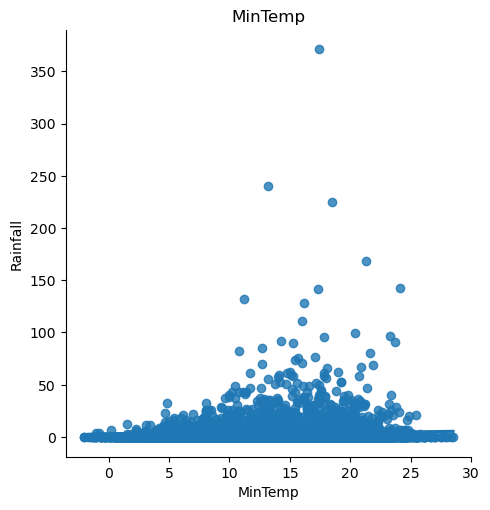

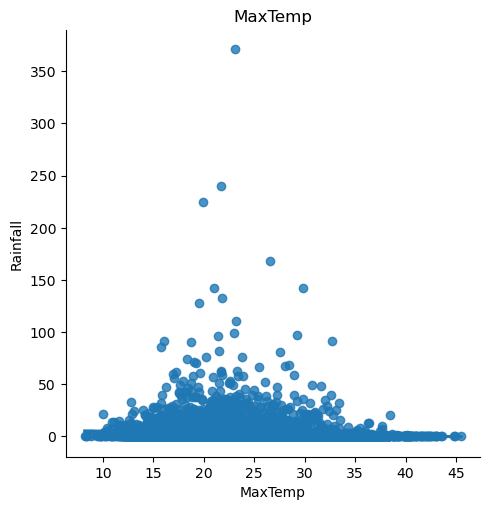

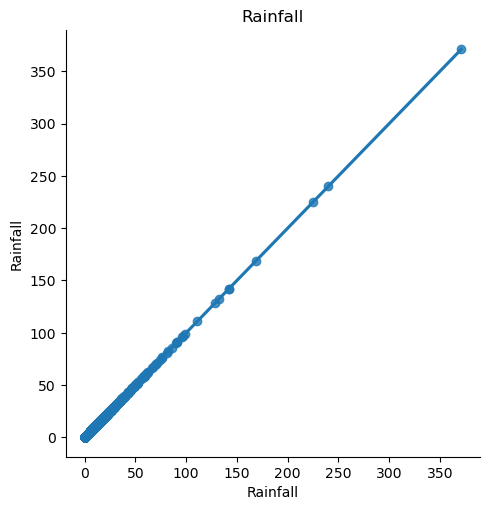

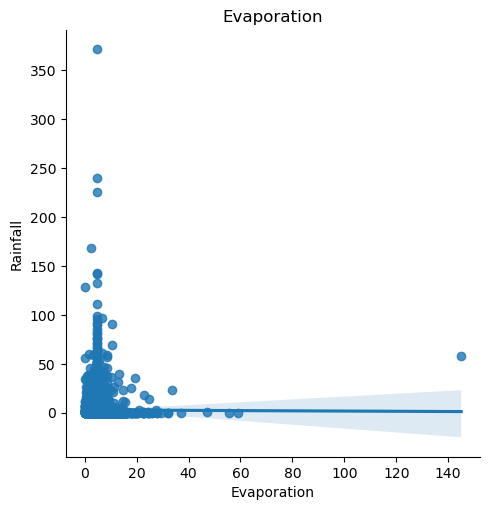

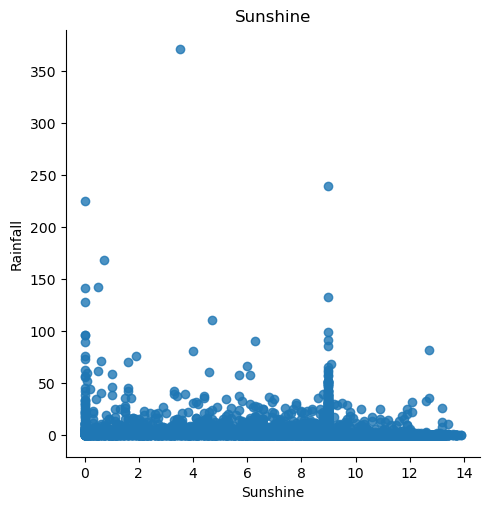

...

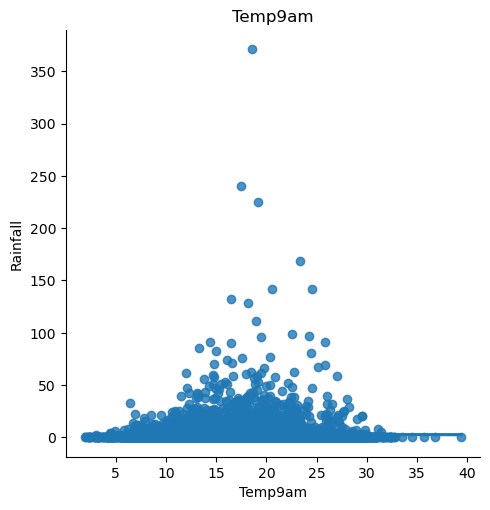

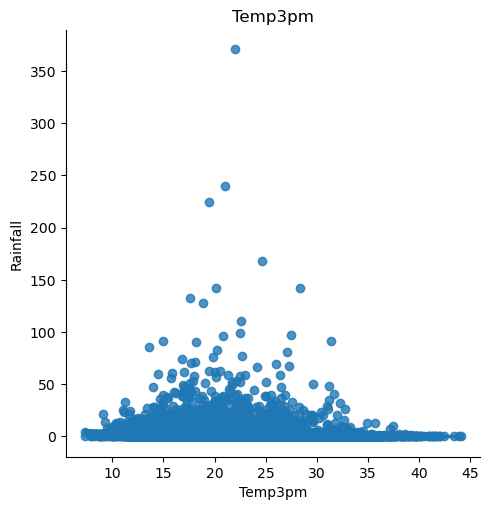

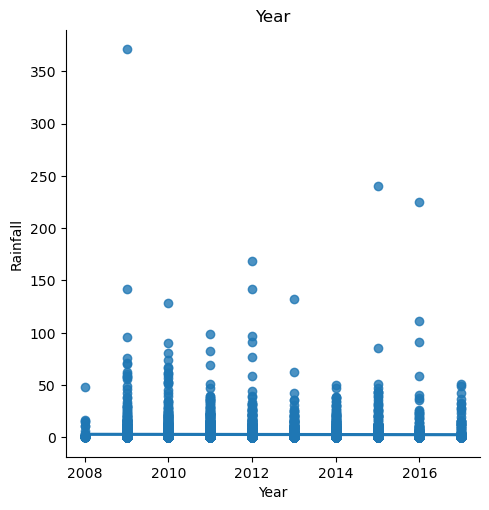

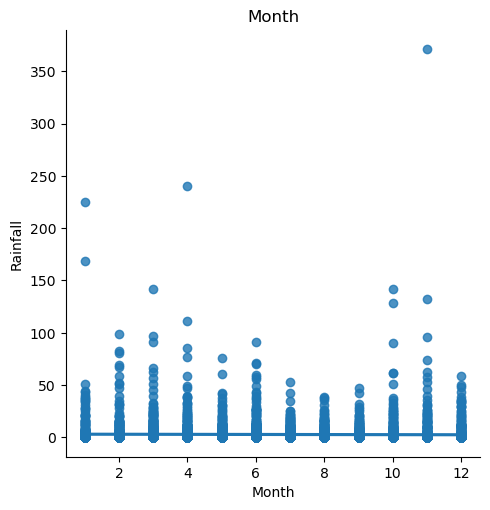

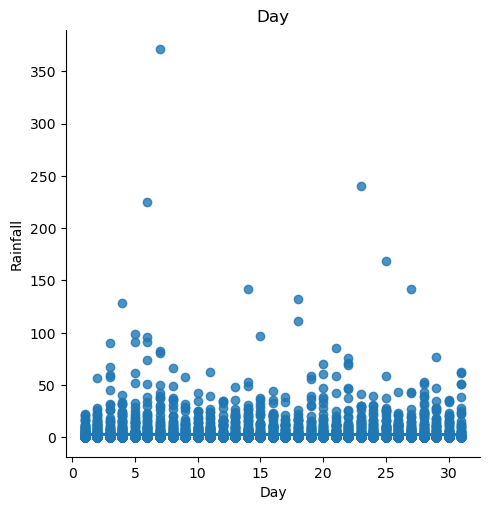

In [45]:
for i in df.columns :
    if df[i].dtypes!=object:
        sns.lmplot(x=i, y='Rainfall', data =df)
        plt.xlabel(i)
        plt.ylabel("Rainfall")
        plt.title(i)
        plt.show()

From the above graphs, we can see that no features have direct/inverse relationship with target variable "Rainfall".

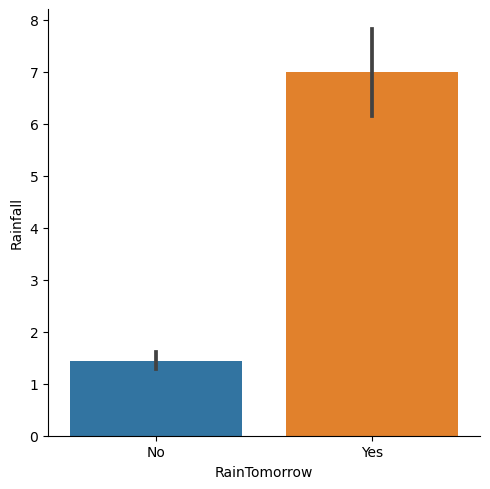

In [46]:
sns.catplot(x='RainTomorrow',y='Rainfall', data=df,kind='bar')

If the amount of rainfall is high, the chances of rain for tommorrow is ver high. 

<Axes: xlabel='RainTomorrow', ylabel='count'>

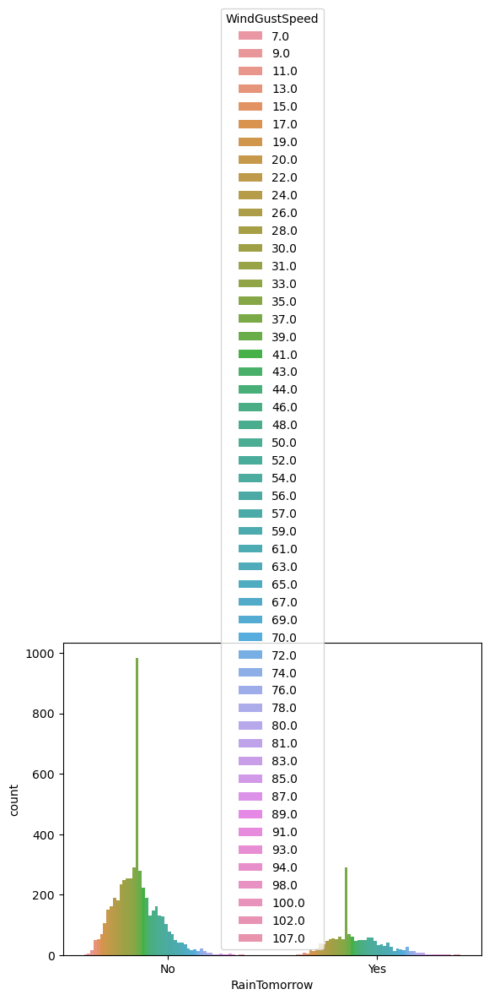

In [47]:
sns.countplot(x='RainTomorrow',hue='WindGustSpeed', data=df)

The chances of Rain Tomorrow is very high if wind Gust speed is around 35.0

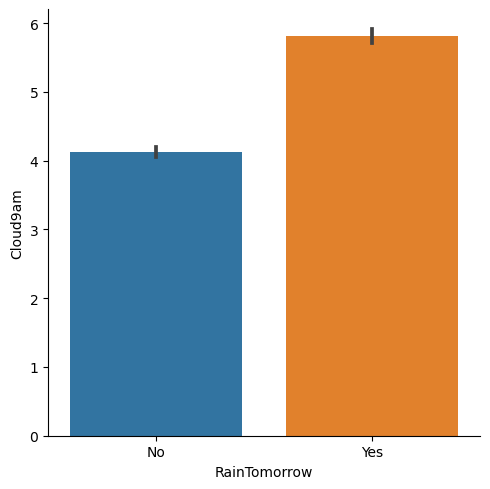

In [49]:
sns.catplot(x='RainTomorrow',y='Cloud9am', data=df,kind='bar')

The Clouds @ 9am are high, The chances of rain tomorrow also high.

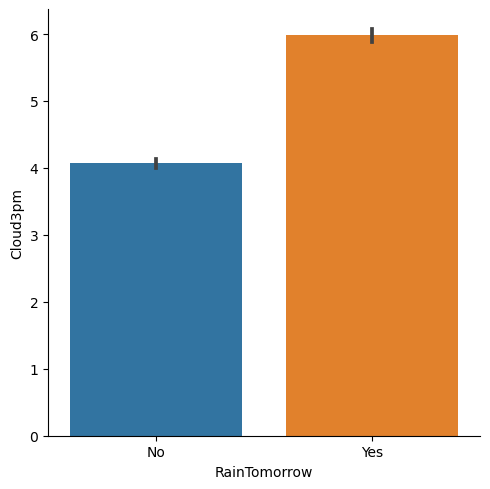

In [466]:
sns.catplot(x='RainTomorrow',y='Cloud3pm', data=df,kind='bar')

The Clouds @ 3pm are high, The chances of rain tomorrow also high.

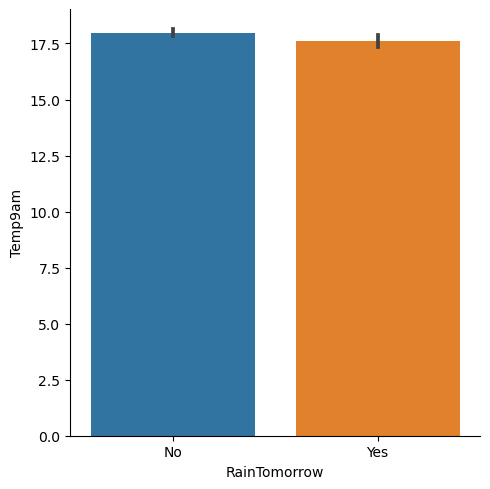

In [467]:
sns.catplot(x='RainTomorrow',y='Temp9am', data=df,kind='bar')

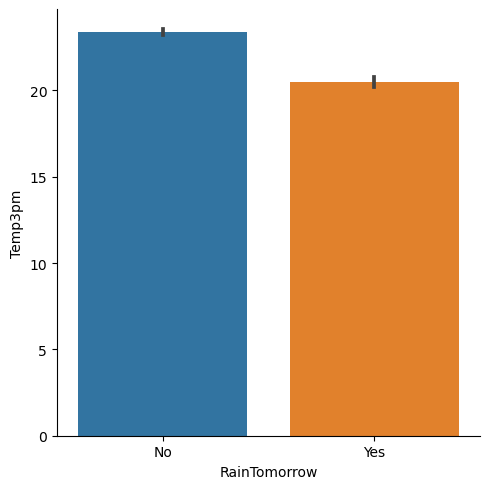

In [468]:
sns.catplot(x='RainTomorrow',y='Temp3pm', data=df,kind='bar')

The Temperature @ 3pm are less, The chances of rain tomorrow is high.

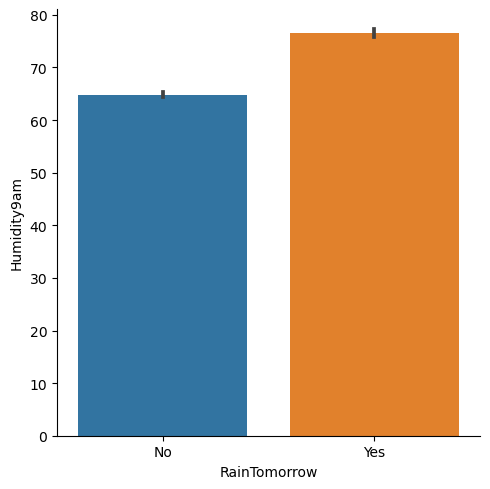

In [469]:
sns.catplot(x='RainTomorrow',y='Humidity9am', data=df,kind='bar')

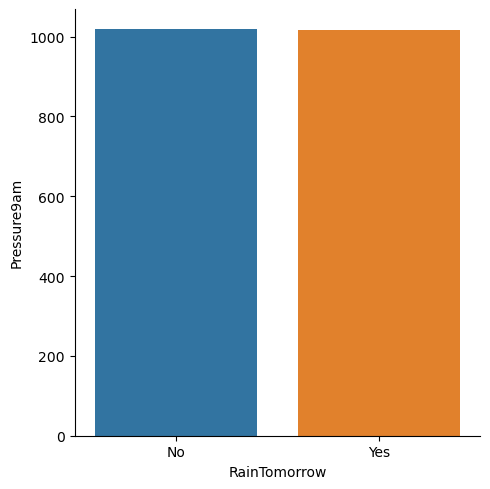

In [470]:
sns.catplot(x='RainTomorrow',y='Pressure9am', data=df,kind='bar')

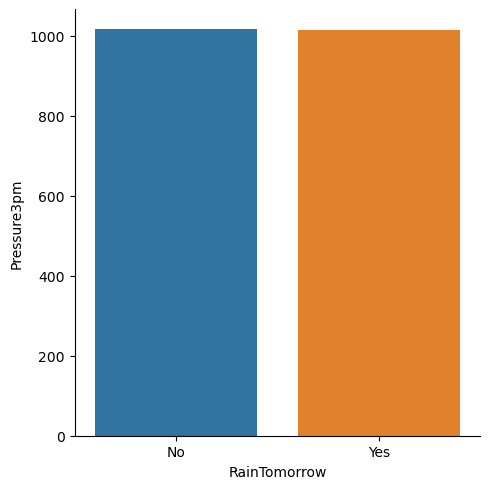

In [471]:
sns.catplot(x='RainTomorrow',y='Pressure3pm', data=df,kind='bar')

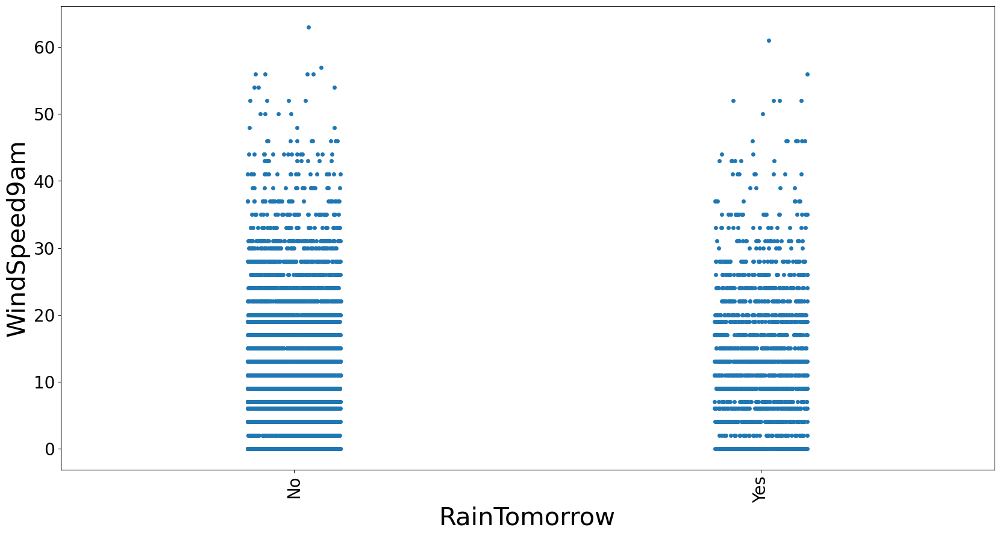

In [472]:
plt.figure(figsize = (20,10))
sns.stripplot(x='RainTomorrow', y='WindSpeed9am', data =df)
plt.xlabel('RainTomorrow', fontsize=30)
plt.ylabel('WindSpeed9am', fontsize=30)
plt.yticks(size=20)
plt.xticks(size=20)
plt.xticks(rotation=90)
plt.show()

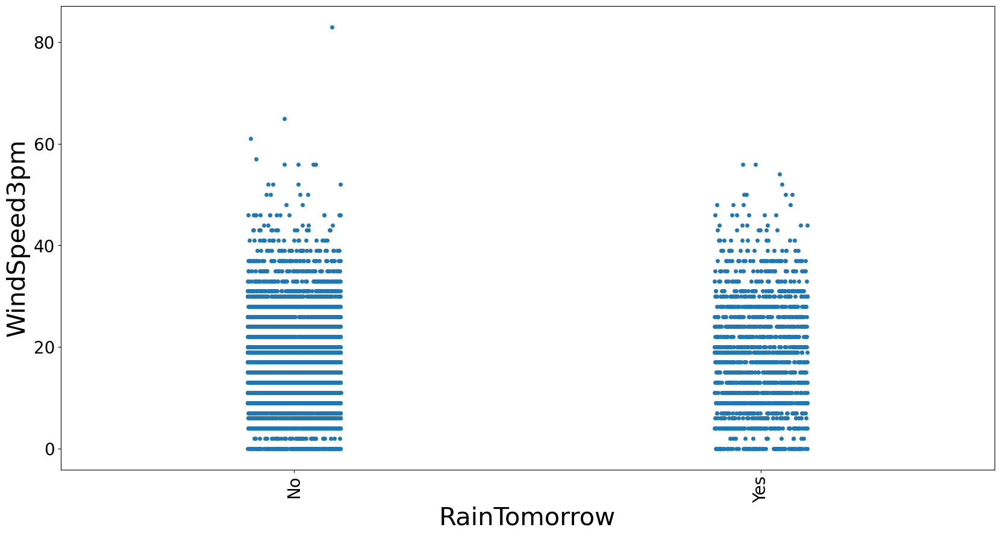

In [473]:
plt.figure(figsize = (20,10))
sns.stripplot(x='RainTomorrow', y='WindSpeed3pm', data =df)
plt.xlabel('RainTomorrow', fontsize=30)
plt.ylabel('WindSpeed3pm', fontsize=30)
plt.yticks(size=20)
plt.xticks(size=20)
plt.xticks(rotation=90)
plt.show()

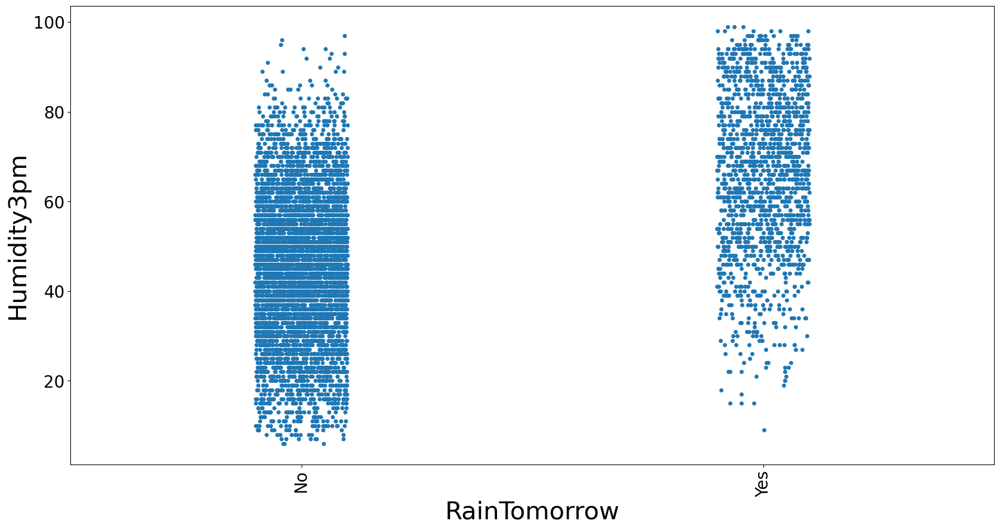

In [474]:
plt.figure(figsize = (20,10))
sns.stripplot(x='RainTomorrow', y='Humidity3pm', data =df)
plt.xlabel('RainTomorrow', fontsize=30)
plt.ylabel('Humidity3pm', fontsize=30)
plt.yticks(size=20)
plt.xticks(size=20)
plt.xticks(rotation=90)
plt.show()

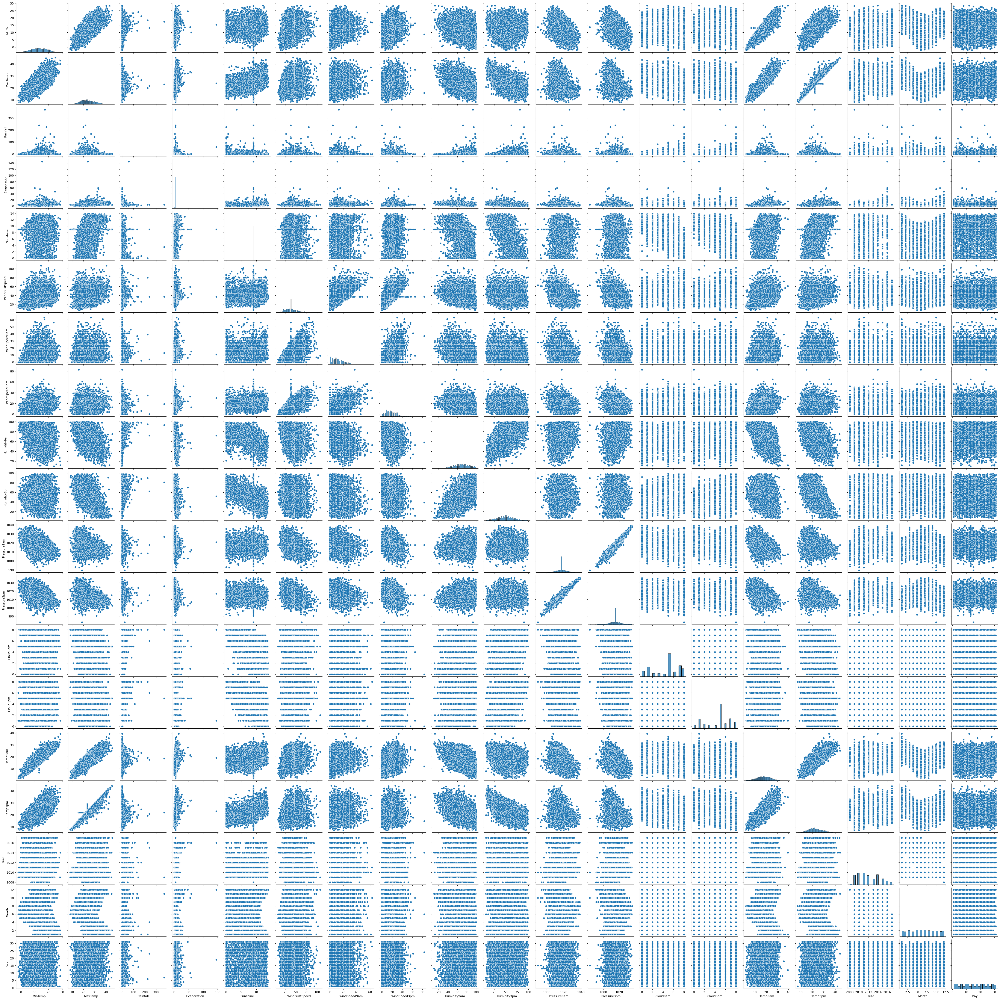

In [50]:
sns.pairplot(data=df)

In [476]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   object 
 1   MinTemp        6762 non-null   float64
 2   MaxTemp        6762 non-null   float64
 3   Rainfall       6762 non-null   float64
 4   Evaporation    6762 non-null   float64
 5   Sunshine       6762 non-null   float64
 6   WindGustDir    6762 non-null   object 
 7   WindGustSpeed  6762 non-null   float64
 8   WindDir9am     6762 non-null   object 
 9   WindDir3pm     6762 non-null   object 
 10  WindSpeed9am   6762 non-null   float64
 11  WindSpeed3pm   6762 non-null   float64
 12  Humidity9am    6762 non-null   float64
 13  Humidity3pm    6762 non-null   float64
 14  Pressure9am    6762 non-null   float64
 15  Pressure3pm    6762 non-null   float64
 16  Cloud9am       6762 non-null   float64
 17  Cloud3pm       6762 non-null   float64
 18  Temp9am 

# Encoding categorical column

Converting Categorical column to numerical

In [477]:
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1,1))

In [478]:
df.sample(15)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
6158,2.0,23.1,29.7,0.2,8.0,10.4,0.0,46.0,9.0,9.0,...,1016.1,5.0,2.0,25.5,29.1,0.0,0.0,2011,1,29
4242,10.0,9.1,21.3,0.0,4.6,9.0,10.0,33.0,14.0,10.0,...,1021.6,5.0,5.0,14.7,19.8,0.0,0.0,2017,5,10
1566,6.0,4.4,19.8,0.0,4.6,9.0,0.0,37.0,3.0,9.0,...,1015.1,0.0,2.0,10.0,18.0,0.0,0.0,2013,7,27
312,1.0,3.2,18.2,0.0,4.6,9.0,10.0,33.0,2.0,8.0,...,1025.7,5.0,5.0,11.8,17.8,0.0,0.0,2009,10,9
1236,3.0,20.7,26.6,3.8,5.0,2.0,10.0,46.0,10.0,12.0,...,1011.1,5.0,8.0,25.7,23.3,1.0,1.0,2010,2,2
2071,6.0,13.3,25.8,0.0,4.6,9.0,0.0,37.0,3.0,9.0,...,1015.1,2.0,1.0,21.5,24.8,0.0,0.0,2014,12,14
1968,6.0,12.3,17.0,0.0,4.6,9.0,0.0,37.0,3.0,9.0,...,1015.1,8.0,7.0,14.2,14.9,0.0,1.0,2014,9,2
1490,3.0,16.3,26.0,0.0,4.8,5.8,5.0,50.0,5.0,5.0,...,1011.1,7.0,7.0,19.6,21.8,0.0,0.0,2010,10,14
7468,8.0,11.0,17.9,1.4,0.2,0.5,4.0,28.0,6.0,14.0,...,1022.3,8.0,8.0,14.5,16.7,1.0,1.0,2012,6,16
4391,11.0,20.5,23.7,0.0,4.6,9.0,6.0,35.0,3.0,1.0,...,1016.5,8.0,7.0,21.7,22.9,0.0,0.0,2009,3,13


In [479]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   float64
 1   MinTemp        6762 non-null   float64
 2   MaxTemp        6762 non-null   float64
 3   Rainfall       6762 non-null   float64
 4   Evaporation    6762 non-null   float64
 5   Sunshine       6762 non-null   float64
 6   WindGustDir    6762 non-null   float64
 7   WindGustSpeed  6762 non-null   float64
 8   WindDir9am     6762 non-null   float64
 9   WindDir3pm     6762 non-null   float64
 10  WindSpeed9am   6762 non-null   float64
 11  WindSpeed3pm   6762 non-null   float64
 12  Humidity9am    6762 non-null   float64
 13  Humidity3pm    6762 non-null   float64
 14  Pressure9am    6762 non-null   float64
 15  Pressure3pm    6762 non-null   float64
 16  Cloud9am       6762 non-null   float64
 17  Cloud3pm       6762 non-null   float64
 18  Temp9am 

# Checking Correlation

In [480]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.090455,0.070761,-0.004972,0.134965,0.068411,-0.086385,0.254955,-0.088884,-0.001275,...,-0.024722,-0.017268,-0.021092,0.098576,0.066010,-0.004280,-0.004506,0.503047,-0.067376,-0.000710
MinTemp,0.090455,1.000000,0.728059,0.090971,0.284696,0.001976,-0.136435,0.242823,-0.020884,-0.139534,...,-0.440282,0.073205,0.022233,0.891417,0.696861,0.075902,0.097173,0.032974,-0.237204,0.014356
MaxTemp,0.070761,0.728059,1.000000,-0.087604,0.356420,0.323262,-0.194877,0.166300,-0.192277,-0.161038,...,-0.413056,-0.247744,-0.246742,0.866654,0.974994,-0.225526,-0.160063,0.081092,-0.171616,0.016108
Rainfall,-0.004972,0.090971,-0.087604,1.000000,-0.003746,-0.190464,0.026811,0.086519,0.091260,0.031770,...,-0.032681,0.184536,0.151333,-0.004365,-0.091795,0.461817,0.223599,-0.008516,-0.015187,-0.007989
Evaporation,0.134965,0.284696,0.356420,-0.003746,1.000000,0.251882,-0.078315,0.177502,-0.073454,-0.039664,...,-0.217644,-0.093375,-0.135537,0.337970,0.347958,-0.113699,-0.077340,0.114748,-0.002998,0.011120
Sunshine,0.068411,0.001976,0.323262,-0.190464,0.251882,1.000000,-0.114589,-0.020876,-0.093530,-0.041657,...,-0.050353,-0.488498,-0.515504,0.185468,0.344193,-0.249807,-0.337550,0.134089,-0.005828,0.000706
WindGustDir,-0.086385,-0.136435,-0.194877,0.026811,-0.078315,-0.114589,1.000000,0.036005,0.378772,0.455305,...,-0.023902,0.133483,0.095415,-0.153390,-0.207326,0.112410,0.045179,-0.174132,0.032066,0.013606
WindGustSpeed,0.254955,0.242823,0.166300,0.086519,0.177502,-0.020876,0.036005,1.000000,-0.065090,0.076963,...,-0.362226,0.004758,0.042975,0.222317,0.130483,0.085641,0.184400,-0.043982,0.048189,-0.002539
WindDir9am,-0.088884,-0.020884,-0.192277,0.091260,-0.073454,-0.093530,0.378772,-0.065090,1.000000,0.216648,...,0.051862,0.079251,0.058186,-0.071205,-0.200530,0.157884,0.040399,-0.062314,0.019799,-0.014730
WindDir3pm,-0.001275,-0.139534,-0.161038,0.031770,-0.039664,-0.041657,0.455305,0.076963,0.216648,1.000000,...,-0.049335,0.075979,0.055951,-0.146437,-0.175251,0.094507,0.004301,0.010694,0.034494,0.001723


<Axes: >

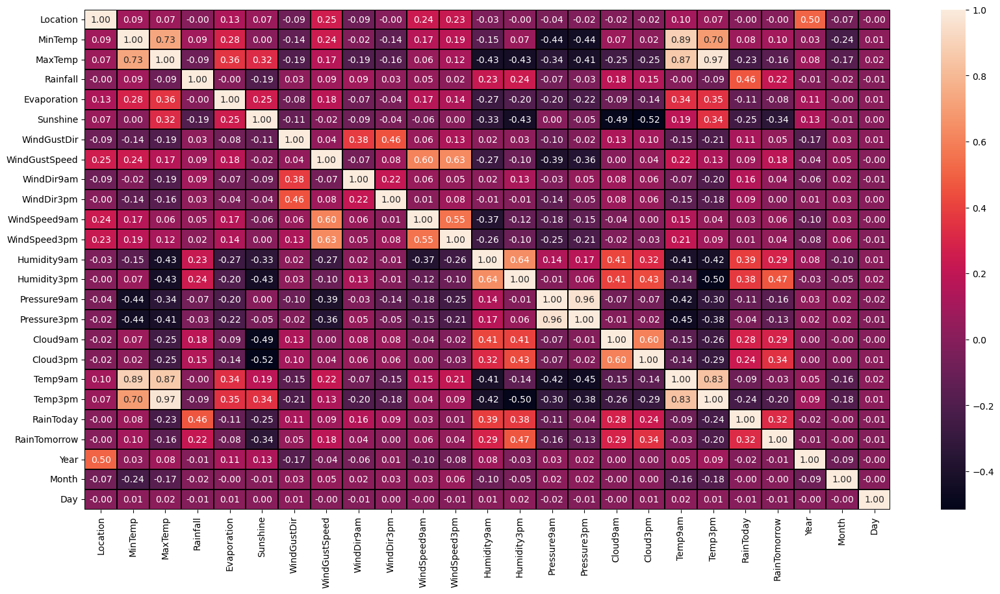

In [481]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(), annot=True, linewidths=0.1, linecolor='black', fmt='0.2f')

From the above, we can see that

    1) The target variable 'RainTommorow' has the highest positive correlation with feature 'Humidity3pm'.
    2) The target variable 'Rainfall' has positive correlation with features 'RainToday', 'RainTomorrow', 'Humidity9am' and 'Humidity3pm'.
    3) The features 'MinTemp', 'MaxTemp', 'Temp9am' and  'Temp3pm' has high correlation with each other.
    4) The features 'Pressure3pm' and  'Pressure9am' has high correlation with each other.

# Checking Outliers

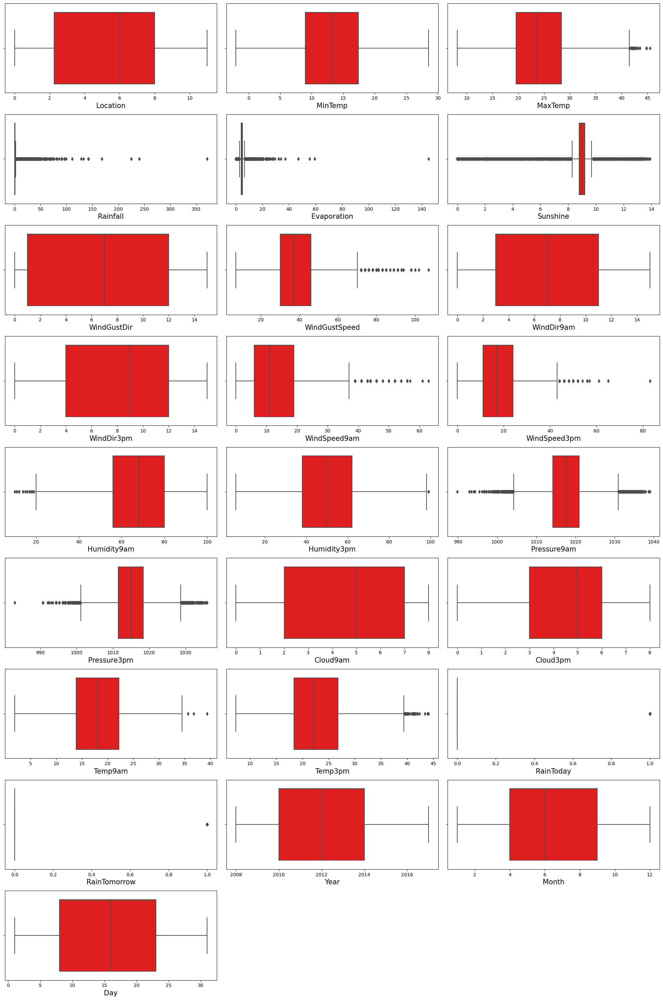

In [482]:
plt.figure(figsize=(20,30))
p=1
for i in df.columns:
    if p<=25:
        ax=plt.subplot(9,3,p)
        sns.boxplot(x=i, data=df,color='red')
        plt.xlabel(i,fontsize=15)
    p+=1
plt.tight_layout()

As, we can see that outliers are present

In [483]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.395097,0.052329,0.194668,0.202435,0.11869,0.207361,1.220923,0.395568,1.315650,1.372365,...,1.343353,1.396453,0.208282,0.174035,0.150755,0.550355,0.550355,1.761148,1.639768,1.675969
1,1.395097,1.030652,0.164227,0.259635,0.11869,0.207361,1.412005,0.395568,0.222688,1.595253,...,1.226045,0.192678,0.208282,0.121606,0.267878,0.550355,0.550355,1.761148,1.639768,1.562245
2,1.395097,0.037920,0.262108,0.259635,0.11869,0.207361,1.603087,0.544900,1.315650,1.595253,...,1.075221,0.192678,1.072084,0.542498,0.083680,0.550355,0.550355,1.761148,1.639768,1.448521
3,1.395097,0.705758,0.637317,0.259635,0.11869,0.207361,0.498814,1.097751,0.436600,1.748064,...,0.388132,0.192678,0.208282,0.035682,0.636275,0.550355,0.550355,1.761148,1.639768,1.334798
4,1.395097,0.792365,1.338795,0.164301,0.11869,0.207361,1.220923,0.171570,1.321500,0.187849,...,1.527694,0.995194,1.488648,0.016748,1.172125,0.550355,0.550355,1.761148,1.639768,1.221074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.186193,1.860937,0.113101,0.259635,0.11869,0.207361,1.263141,0.575089,0.436600,1.525176,...,0.868739,0.192678,0.208282,1.362432,0.050283,0.550355,0.550355,2.150387,0.136841,0.598504
8421,1.186193,1.716540,0.196854,0.259635,0.11869,0.207361,0.116650,1.247082,0.436600,1.079401,...,0.667639,0.192678,0.208282,1.222621,0.301369,0.550355,0.550355,2.150387,0.136841,0.712227
8422,1.186193,1.391646,0.457869,0.259635,0.11869,0.207361,0.689895,0.127093,0.436600,1.372365,...,0.282199,0.192678,0.208282,0.942998,0.569294,0.550355,0.550355,2.150387,0.136841,0.825951
8423,1.186193,0.958453,0.474183,0.259635,0.11869,0.207361,0.456596,0.799087,0.656363,1.079401,...,0.231924,0.609839,1.072084,0.488611,0.552548,0.550355,0.550355,2.150387,0.136841,0.939675


In [484]:
# threshold =3
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
         568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
         770,  795,  796,  797,  802,  928,  928,  928,  935,  941,  949,
         978,  979,  979,  980,  980,  980,  980,  981, 1007, 1008, 1008,
        1009, 1010, 1011, 1115, 1138, 1138, 1148, 1148, 1149, 1150, 1151,
        1189, 1202, 1202, 1203, 1237, 1241, 1264, 1264, 1265, 1265, 1356,
        1357, 1386, 1411, 1412, 1413, 1465, 1466, 1479, 1479, 1480, 1480,
        1481, 1486, 1513, 1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680,
        1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2074, 2108,
        2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429, 2488, 2500,
        2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2827, 2835, 2837,
        2849, 2849, 2855, 2859, 2863, 

In [485]:
z.iloc[8,7]

3.0835422168793576

In [486]:
df_new=df[(z<3).all(axis=1)]
df_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.0,13.4,22.9,0.6,4.6,9.0,13.0,44.0,13.0,14.0,...,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,2008,12,1
1,1.0,7.4,25.1,0.0,4.6,9.0,14.0,44.0,6.0,15.0,...,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,2008,12,2
2,1.0,12.9,25.7,0.0,4.6,9.0,15.0,46.0,13.0,15.0,...,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,2008,12,3
3,1.0,9.2,28.0,0.0,4.6,9.0,4.0,24.0,9.0,0.0,...,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,2008,12,4
4,1.0,17.5,32.3,1.0,4.6,9.0,13.0,41.0,1.0,7.0,...,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,4.6,9.0,0.0,31.0,9.0,1.0,...,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,2017,6,21
8421,9.0,3.6,25.3,0.0,4.6,9.0,6.0,22.0,9.0,3.0,...,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,2017,6,22
8422,9.0,5.4,26.9,0.0,4.6,9.0,3.0,37.0,9.0,14.0,...,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,2017,6,23
8423,9.0,7.8,27.0,0.0,4.6,9.0,9.0,28.0,10.0,3.0,...,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,2017,6,24


In [487]:
df_new.shape

(6305, 25)

In [488]:
df.shape

(6762, 25)

In [489]:
print("Data loss percentage = ",((df.shape[0]-df_new.shape[0])/df.shape[0])*100)

Data loss percentage =  6.758355516119491


In [490]:
df=df_new

In [491]:
df.shape

(6305, 25)

# Checking Skewness

In [492]:
df.skew()

Location        -0.005041
MinTemp         -0.073640
MaxTemp          0.263690
Rainfall         3.572436
Evaporation      1.136753
Sunshine        -1.358828
WindGustDir      0.109246
WindGustSpeed    0.544830
WindDir9am       0.214975
WindDir3pm      -0.128511
WindSpeed9am     0.680216
WindSpeed3pm     0.342765
Humidity9am     -0.224837
Humidity3pm      0.139294
Pressure9am      0.067423
Pressure3pm      0.088337
Cloud9am        -0.400423
Cloud3pm        -0.370944
Temp9am         -0.075437
Temp3pm          0.288331
RainToday        1.371384
RainTomorrow     1.383878
Year             0.338266
Month            0.030646
Day              0.005324
dtype: float64

In [493]:
#Importing PowerTransformer
from sklearn.preprocessing import PowerTransformer

In [494]:
# Columns to be transformed
skew_columns = ['Evaporation', 'Sunshine', 'WindSpeed9am']

scaler = PowerTransformer(method='yeo-johnson')
df[skew_columns] = scaler.fit_transform(df[skew_columns].values)

# Checking Skewness after treating skewness
df.skew()

Location        -0.005041
MinTemp         -0.073640
MaxTemp          0.263690
Rainfall         3.572436
Evaporation      0.059545
Sunshine        -0.097213
WindGustDir      0.109246
WindGustSpeed    0.544830
WindDir9am       0.214975
WindDir3pm      -0.128511
WindSpeed9am    -0.132272
WindSpeed3pm     0.342765
Humidity9am     -0.224837
Humidity3pm      0.139294
Pressure9am      0.067423
Pressure3pm      0.088337
Cloud9am        -0.400423
Cloud3pm        -0.370944
Temp9am         -0.075437
Temp3pm          0.288331
RainToday        1.371384
RainTomorrow     1.383878
Year             0.338266
Month            0.030646
Day              0.005324
dtype: float64

Here, we can see that skewness are removed.

For target variables and Categorical datas, no need to remove skewness.

# 1.MODEL BUILDING For Predicting Rainfall.

Splitting target variable

In [495]:
x = df.drop("Rainfall", axis = 1)
y= df['Rainfall']

In [496]:
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.0,13.4,22.9,0.010453,0.025501,13.0,44.0,13.0,14.0,0.909844,...,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,2008,12,1
1,1.0,7.4,25.1,0.010453,0.025501,14.0,44.0,6.0,15.0,-0.851994,...,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,2008,12,2
2,1.0,12.9,25.7,0.010453,0.025501,15.0,46.0,13.0,15.0,0.827531,...,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,2008,12,3
3,1.0,9.2,28.0,0.010453,0.025501,4.0,24.0,9.0,0.0,0.073772,...,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,2008,12,4
4,1.0,17.5,32.3,0.010453,0.025501,13.0,41.0,1.0,7.0,-0.404220,...,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.010453,0.025501,0.0,31.0,9.0,1.0,0.281788,...,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,2017,6,21
8421,9.0,3.6,25.3,0.010453,0.025501,6.0,22.0,9.0,3.0,0.281788,...,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,2017,6,22
8422,9.0,5.4,26.9,0.010453,0.025501,3.0,37.0,9.0,14.0,-0.152891,...,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,2017,6,23
8423,9.0,7.8,27.0,0.010453,0.025501,9.0,28.0,10.0,3.0,0.281788,...,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,2017,6,24


In [497]:
y

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: Rainfall, Length: 6305, dtype: float64

# To remove biasness, we use Standard scaler method

In [498]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,-1.390820,0.076961,-0.200778,0.010453,0.025501,1.224412,0.506080,1.321318,1.371163,0.909844,...,-1.440770,1.434875,0.247573,-0.163278,-0.159443,-0.526886,-0.524183,-1.771042,1.653994,-1.671897
1,-1.390820,-1.005480,0.164759,0.010453,0.025501,1.415150,0.506080,-0.221198,1.594258,-0.851994,...,-1.316916,0.226798,0.247573,-0.110642,0.267119,-0.526886,-0.524183,-1.771042,1.653994,-1.558125
2,-1.390820,-0.013242,0.264451,0.010453,0.025501,1.605888,0.669973,1.321318,1.594258,0.827531,...,-1.157675,0.226798,-1.040693,0.556076,0.079432,-0.526886,-0.524183,-1.771042,1.653994,-1.444353
3,-1.390820,-0.680748,0.646603,0.010453,0.025501,-0.492227,-1.132851,0.439880,-1.752177,0.073772,...,-0.432243,0.226798,0.247573,0.047265,0.642493,-0.526886,-0.524183,-1.771042,1.653994,-1.330582
4,-1.390820,0.816629,1.361061,0.010453,0.025501,1.224412,0.260240,-1.322996,-0.190507,-0.404220,...,-1.635398,1.032183,1.535840,-0.005371,1.188493,-0.526886,-0.524183,-1.771042,1.653994,-1.216810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6300,1.194987,-1.835352,-0.117701,0.010453,0.025501,-1.255179,-0.559225,0.439880,-1.529081,0.281788,...,0.894768,0.226798,0.247573,-1.356351,-0.057068,-0.526886,-0.524183,2.153732,-0.135987,0.603542
6301,1.194987,-1.691026,0.197990,0.010453,0.025501,-0.110752,-1.296744,0.439880,-1.082890,0.281788,...,0.682446,0.226798,0.247573,-1.215990,0.301244,-0.526886,-0.524183,2.153732,-0.135987,0.717314
6302,1.194987,-1.366294,0.463834,0.010453,0.025501,-0.682965,-0.067546,0.439880,1.371163,-0.152891,...,0.275496,0.226798,0.247573,-0.935267,0.574244,-0.526886,-0.524183,2.153732,-0.135987,0.831086
6303,1.194987,-0.933317,0.480450,0.010453,0.025501,0.461461,-0.805065,0.660240,-1.082890,0.281788,...,0.222416,-0.578587,-1.040693,-0.479091,0.557181,-0.526886,-0.524183,2.153732,-0.135987,0.944858


# Checking multicollinearity

In [499]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.656773,Location
1,9.215136,MinTemp
2,26.509540,MaxTemp
3,1.741924,Evaporation
4,2.038770,Sunshine
5,1.580667,WindGustDir
6,2.310707,WindGustSpeed
7,1.350673,WindDir9am
8,1.421606,WindDir3pm
9,2.042789,WindSpeed9am


We can see that multicollinearity present between 'Temp3pm', 'Temp9am','MaxTemp' columns and between 'Pressure9am', 'Pressure3pm' columns.

In [501]:
#Droppin 'Temp9am' column and check
x.drop(['Temp9am'], axis=1, inplace=True)

In [502]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.654718,Location
1,5.542344,MinTemp
2,25.883691,MaxTemp
3,1.735110,Evaporation
4,2.034722,Sunshine
5,1.576676,WindGustDir
6,2.278224,WindGustSpeed
7,1.349796,WindDir9am
8,1.421254,WindDir3pm
9,2.024237,WindSpeed9am


In [503]:
#Dropping 'Temp3pm' column and check
x.drop(['Temp3pm'], axis=1, inplace=True)

In [504]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.654164,Location
1,4.968362,MinTemp
2,5.813596,MaxTemp
3,1.734848,Evaporation
4,2.029485,Sunshine
5,1.574941,WindGustDir
6,2.258438,WindGustSpeed
7,1.348800,WindDir9am
8,1.419901,WindDir3pm
9,2.024072,WindSpeed9am


In [505]:
#Dropping 'Pressure9am' column and check
x.drop(['Pressure9am'], axis=1, inplace=True)

In [506]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.651878,Location
1,4.790467,MinTemp
2,5.578491,MaxTemp
3,1.722542,Evaporation
4,2.021710,Sunshine
5,1.562763,WindGustDir
6,2.239006,WindGustSpeed
7,1.323107,WindDir9am
8,1.344875,WindDir3pm
9,2.016353,WindSpeed9am


Now, we can see that collineraity has been removed between features.

# MODEL BUILDING

Finding best random state

In [507]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [508]:
maxAcc = 0
maxRS= 0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    LR = LinearRegression()
    LR.fit(x_train,y_train)
    pred = LR.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRS = i
        
print("The best r2_score is ", maxAcc, "at random state ", maxRS)

The best r2_score is  0.5439377735441786 at random state  176


Train Test split

In [509]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxRS)

# Regression Algorithms

In [510]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso,Ridge
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score

In [511]:
#Creating a list for models
LR = LinearRegression()
KNN = KNeighborsRegressor()
DTC = DecisionTreeRegressor()
RFR = RandomForestRegressor()
ETC = ExtraTreesRegressor()
GBR = GradientBoostingRegressor()
ABR = AdaBoostRegressor()
BR = BaggingRegressor()
LS = Lasso()
RD = Ridge()

models = [LR, KNN, DTC, RFR, ETC, GBR, ABR, BR, LS, RD]

# ACCURACY(R2 SCORE) AND CROSS VALIDATION SCORE FOR ALL MODELS.

In [512]:
for i in models:
    print(i)
    print("------------------------")
    i.fit(x_train,y_train)
    pred = i.predict(x_test)
    pred_train = i.predict(x_train)
    print('R2_score : ', r2_score(y_test,pred)*100)
    print('R2_score on training data : ', r2_score(y_train,pred_train)*100)
    print('Mean Absolute Error : ', mean_absolute_error(y_test,pred))
    print('Mean Squared Error : ', mean_squared_error(y_test,pred))
    print('Root Mean Squared Error : ', np.sqrt(mean_squared_error(y_test,pred)))
    print("Cross Validation:")
    print("-----------------")
    score = cross_val_score(i,x,y)
    print("CV Scores are : ", score)
    print("CV Score mean : ", score.mean())
    print("Difference between R2_score score and CV score is ", (r2_score(y_test,pred) - score.mean())*100)
    print('\n\n')

LinearRegression()
------------------------
R2_score :  54.393777354417864
R2_score on training data :  49.01511790898425
Mean Absolute Error :  1.369733120105313
Mean Squared Error :  8.91885021350935
Root Mean Squared Error :  2.986444409914464
Cross Validation:
-----------------
CV Scores are :  [0.50495418 0.49359566 0.47452719 0.48203747 0.52865599]
CV Score mean :  0.4967540994628708
Difference between R2_score score and CV score is  4.7183674081307805



KNeighborsRegressor()
------------------------
R2_score :  44.72861136455848
R2_score on training data :  63.18190682883272
Mean Absolute Error :  1.2436575052854122
Mean Squared Error :  10.80899069767442
Root Mean Squared Error :  3.2877029515566667
Cross Validation:
-----------------
CV Scores are :  [0.46822912 0.38881943 0.41171424 0.39258891 0.4481158 ]
CV Score mean :  0.42189349884030236
Difference between R2_score score and CV score is  2.539261480528243



DecisionTreeRegressor()
------------------------
R2_score :  3.

As we can see that GradientBoostingRegressor has the highest R2_score and cross_val_score and the diff bet r2 score and cv also less

# GradientBoostingRegressor is our best model

# Hyper Parameter Tuning

In [513]:
#Using Grid Search CV on Gradient Boosting Regressor

from sklearn.model_selection import GridSearchCV

parameters = {'criterion' : ['friedman_mse', 'squared_error'],
              'n_estimators' : [50, 100, 200],
              'max_depth' : [1, 3, 5],
              'learning_rate': [0.01, 0.1, 0.2, 0.3]}

In [514]:
GCV = GridSearchCV(GradientBoostingRegressor(), parameters, cv = 5 )

In [515]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.01, 0.1, 0.2, 0.3],
                         'max_depth': [1, 3, 5],
                         'n_estimators': [50, 100, 200]})

In [516]:
Best_Parameters = GCV.best_params_
print(Best_Parameters)

{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200}


Finding best random state for our best model.

In [517]:
maxAcc = 0
maxiRS= 0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    GBR = GradientBoostingRegressor()
    GBR.fit(x_train,y_train)
    pred = GBR.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxiRS = i
        
print("The best r2_score is ", maxAcc, "at random state ", maxiRS)

The best r2_score is  0.5583229237879355 at random state  176


# Building Final model using best parameters

In [520]:
Final_model= GradientBoostingRegressor(criterion = 'friedman_mse', max_depth = 3, n_estimators = 200, learning_rate = 0.01)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=176)
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
print('R2_score : ', r2_score(y_test,pred))
print('Mean Absolute Error : ', mean_absolute_error(y_test,pred))
print('Mean Squared Error : ', mean_squared_error(y_test,pred))
print('Root Mean Squared Error : ', np.sqrt(mean_squared_error(y_test,pred)))

R2_score :  0.5537125273797794
Mean Absolute Error :  1.255395707378428
Mean Squared Error :  8.727693041798057
Root Mean Squared Error :  2.9542669212171835


# The R2_score for our best model is 55%

# Saving the Best model

In [521]:
import joblib
joblib.dump(Final_model, "Rainfall_Amount_mm_Prediction.pkl")

['Rainfall_Amount_mm_Prediction.pkl']

# Loading and Prediction

In [522]:
load_model= joblib.load("Rainfall_Amount_mm_Prediction.pkl")

In [523]:
prediction=pd.DataFrame([load_model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

In [524]:
prediction

,0,1,2,3,4,5,6,7,8,9,...,1882,1883,1884,1885,1886,1887,1888,1889,1890,1891
Predicted,0.27491,0.275235,0.260391,0.262589,0.392147,0.262796,0.415166,0.288422,0.27189,0.281203,...,0.282177,0.273976,0.314294,6.619661,0.274086,0.271733,0.281854,0.269842,6.859662,0.339414
Original,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,11.200000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000


Text(0, 0.5, 'Predicted Rainfall Amount in mm')

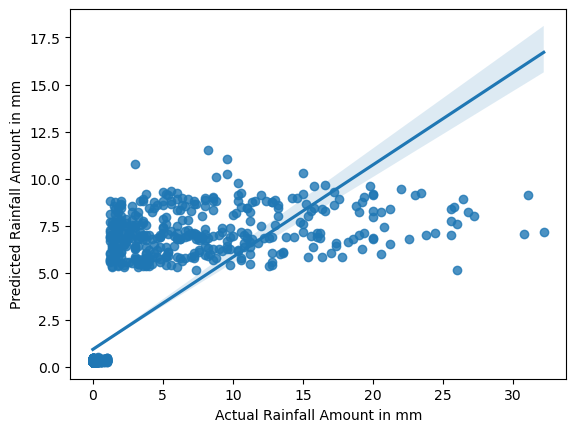

In [525]:
sns.regplot(x=y_test[:],y=load_model.predict(x_test)[:])
plt.xlabel('Actual Rainfall Amount in mm')
plt.ylabel('Predicted Rainfall Amount in mm')

# 2.MODEL BUILDING For Predicting "RainTommorow".

In [534]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.0,13.4,22.9,0.6,0.010453,0.025501,13.0,44.0,13.0,14.0,...,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,2008,12,1
1,1.0,7.4,25.1,0.0,0.010453,0.025501,14.0,44.0,6.0,15.0,...,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,2008,12,2
2,1.0,12.9,25.7,0.0,0.010453,0.025501,15.0,46.0,13.0,15.0,...,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,2008,12,3
3,1.0,9.2,28.0,0.0,0.010453,0.025501,4.0,24.0,9.0,0.0,...,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,2008,12,4
4,1.0,17.5,32.3,1.0,0.010453,0.025501,13.0,41.0,1.0,7.0,...,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,2008,12,5


# Splitting Target variable

In [535]:
x = df.drop("RainTomorrow", axis = 1)
y= df['RainTomorrow']

In [536]:
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,1.0,13.4,22.9,0.6,0.010453,0.025501,13.0,44.0,13.0,14.0,...,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,2008,12,1
1,1.0,7.4,25.1,0.0,0.010453,0.025501,14.0,44.0,6.0,15.0,...,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,2008,12,2
2,1.0,12.9,25.7,0.0,0.010453,0.025501,15.0,46.0,13.0,15.0,...,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,2008,12,3
3,1.0,9.2,28.0,0.0,0.010453,0.025501,4.0,24.0,9.0,0.0,...,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,2008,12,4
4,1.0,17.5,32.3,1.0,0.010453,0.025501,13.0,41.0,1.0,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,0.010453,0.025501,0.0,31.0,9.0,1.0,...,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,2017,6,21
8421,9.0,3.6,25.3,0.0,0.010453,0.025501,6.0,22.0,9.0,3.0,...,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,2017,6,22
8422,9.0,5.4,26.9,0.0,0.010453,0.025501,3.0,37.0,9.0,14.0,...,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,2017,6,23
8423,9.0,7.8,27.0,0.0,0.010453,0.025501,9.0,28.0,10.0,3.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,2017,6,24


In [529]:
y

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: RainTomorrow, Length: 6305, dtype: float64

# To remove biasness, we use Standard scaler method

In [537]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,-1.390820,0.076961,-0.200778,-0.253612,0.010453,0.025501,1.224412,0.506080,1.321318,1.371163,...,-1.767186,-1.440770,1.434875,0.247573,-0.163278,-0.159443,-0.526886,-1.771042,1.653994,-1.671897
1,-1.390820,-1.005480,0.164759,-0.383028,0.010453,0.025501,1.415150,0.506080,-0.221198,1.594258,...,-1.258439,-1.316916,0.226798,0.247573,-0.110642,0.267119,-0.526886,-1.771042,1.653994,-1.558125
2,-1.390820,-0.013242,0.264451,-0.383028,0.010453,0.025501,1.605888,0.669973,1.321318,1.594258,...,-1.784729,-1.157675,0.226798,-1.040693,0.556076,0.079432,-0.526886,-1.771042,1.653994,-1.444353
3,-1.390820,-0.680748,0.646603,-0.383028,0.010453,0.025501,-0.492227,-1.132851,0.439880,-1.752177,...,-0.030428,-0.432243,0.226798,0.247573,0.047265,0.642493,-0.526886,-1.771042,1.653994,-1.330582
4,-1.390820,0.816629,1.361061,-0.167335,0.010453,0.025501,1.224412,0.260240,-1.322996,-0.190507,...,-1.223353,-1.635398,1.032183,1.535840,-0.005371,1.188493,-0.526886,-1.771042,1.653994,-1.216810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6300,1.194987,-1.835352,-0.117701,-0.383028,0.010453,0.025501,-1.255179,-0.559225,0.439880,-1.529081,...,1.197582,0.894768,0.226798,0.247573,-1.356351,-0.057068,-0.526886,2.153732,-0.135987,0.603542
6301,1.194987,-1.691026,0.197990,-0.383028,0.010453,0.025501,-0.110752,-1.296744,0.439880,-1.082890,...,1.004609,0.682446,0.226798,0.247573,-1.215990,0.301244,-0.526886,2.153732,-0.135987,0.717314
6302,1.194987,-1.366294,0.463834,-0.383028,0.010453,0.025501,-0.682965,-0.067546,0.439880,1.371163,...,0.566034,0.275496,0.226798,0.247573,-0.935267,0.574244,-0.526886,2.153732,-0.135987,0.831086
6303,1.194987,-0.933317,0.480450,-0.383028,0.010453,0.025501,0.461461,-0.805065,0.660240,-1.082890,...,0.285346,0.222416,-0.578587,-1.040693,-0.479091,0.557181,-0.526886,2.153732,-0.135987,0.944858


# Checking multicollinearity

In [540]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.649471,Location
1,9.207336,MinTemp
2,26.491210,MaxTemp
3,2.019668,Rainfall
4,1.742096,Evaporation
5,2.017318,Sunshine
6,1.578656,WindGustDir
7,2.227518,WindGustSpeed
8,1.351705,WindDir9am
9,1.420197,WindDir3pm


In [541]:
x.drop(['Pressure9am'], axis=1, inplace=True)
x.drop(['Temp3pm'], axis=1, inplace=True)
x.drop(['Temp9am'], axis=1, inplace=True)

In [543]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.643899,Location
1,4.768966,MinTemp
2,5.557676,MaxTemp
3,2.015637,Rainfall
4,1.723050,Evaporation
5,2.001429,Sunshine
6,1.561274,WindGustDir
7,2.158682,WindGustSpeed
8,1.324215,WindDir9am
9,1.342145,WindDir3pm


Now, we can see that collineraity has been removed between features.

# Balancing dataset

Since the target variable is categorical, we need to balance the dataset, inorder to avoid under/over fitting.

In [544]:
y.value_counts()

0.0    4946
1.0    1359
Name: RainTomorrow, dtype: int64

Here, we can see that data is not balanced. Since it is a classification problem, we will balance the data using oversampling method

In [545]:
import sklearn
from imblearn.over_sampling import SMOTE
SME = SMOTE()
x1,y1 = SME.fit_resample(x,y)

In [546]:
y1.value_counts()

0.0    4946
1.0    4946
Name: RainTomorrow, dtype: int64

Now, the dataset is balanced, we can go for model building

# Model Building

Finding the best random state.

In [549]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
maxAcc = 0
maxRS= 0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred = RFC.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRS = i
        
print("The best accuracy is ", maxAcc, "at random state ", maxRS)

The best accuracy is  0.910377358490566 at random state  70


# Train Test Split

In [550]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=maxRS)

# Classification Algorithms

In [551]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve

In [552]:
#Creating a list for models
LR = LogisticRegression()
KNN = KNeighborsClassifier()
DTC = DecisionTreeClassifier()
RFC = RandomForestClassifier()
ETC = ExtraTreesClassifier()
GBC = GradientBoostingClassifier()
ABC = AdaBoostClassifier()
BC = BaggingClassifier()
GNB = GaussianNB()
SV = SVC()

models = [LR, KNN, DTC, RFC, ETC, GBC, ABC, BC, GNB, SV]

# Accuracy and CV score for all Classification Models.

In [553]:
for i in models:
    print(i)
    print("------------------------")
    i.fit(x_train,y_train)
    pred = i.predict(x_test)
    print("Accuracy for ",i,"model is ", accuracy_score(y_test,pred)*100)
    print(confusion_matrix(y_test,pred))
    print(classification_report(y_test,pred))
    print("Cross Validation:")
    print("-----------------")
    cv_score = cross_val_score(i,x1,y1)
    print("CV Scores are : ",cv_score)
    print("CV Score mean : ",cv_score.mean())
    print("Difference between Accuracy score and CV score is ", accuracy_score(y_test,pred) - cv_score.mean())
    print('\n\n')

LogisticRegression()
------------------------
Accuracy for  LogisticRegression() model is  79.5822102425876
[[1165  284]
 [ 322 1197]]
              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79      1449
         1.0       0.81      0.79      0.80      1519

    accuracy                           0.80      2968
   macro avg       0.80      0.80      0.80      2968
weighted avg       0.80      0.80      0.80      2968

Cross Validation:
-----------------
CV Scores are :  [0.6993431  0.6634664  0.65217391 0.75176946 0.82861476]
CV Score mean :  0.7190735278564462
Difference between Accuracy score and CV score is  0.07674857456942985



KNeighborsClassifier()
------------------------
Accuracy for  KNeighborsClassifier() model is  84.87196765498652
[[1075  374]
 [  75 1444]]
              precision    recall  f1-score   support

         0.0       0.93      0.74      0.83      1449
         1.0       0.79      0.95      0.87      1519

    accuracy  

Extra Trees Classifier is our best model because Accuracy score and CV Score is high and difference between Accuracy score and CV score is least

# Extra Trees Classifier is our best model

# Hyper Parameter Tuning

In [570]:
#Using Grid Search CV on Extra Trees Classifier

from sklearn.model_selection import GridSearchCV

parameters = {'criterion' : ['gini', 'entropy', 'log_loss'],
              'n_estimators' : [50, 100, 200],
              'max_depth' : [0, 10, 20],
              'max_features': ['auto', 'sqrt'],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4]}

In [571]:
GCV = GridSearchCV(ExtraTreesClassifier(), parameters, cv = 5 )

In [572]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [0, 10, 20],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]})

In [573]:
Best_Parameters = GCV.best_params_
print(Best_Parameters)

{'criterion': 'entropy', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


# Finding best random state for our best model.

In [558]:
maxAcc = 0
maxRS= 0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    ETC = ExtraTreesClassifier()
    ETC.fit(x_train,y_train)
    pred = ETC.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRS = i
        
print("The best accuracy is ", maxAcc, "at random state ", maxRS)

The best accuracy is  0.9316037735849056 at random state  70


# Building Final model using best parameters

In [574]:
Final_model= ExtraTreesClassifier(criterion = 'entropy', max_depth = 20, n_estimators = 200, max_features ='sqrt', min_samples_split = 2 , min_samples_leaf = 1)
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=70)
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
Accuracy = accuracy_score(y_test,pred)
print("Accuracy is ", Accuracy*100 )
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy is  92.18328840970351
[[1305  144]
 [  88 1431]]
              precision    recall  f1-score   support

         0.0       0.94      0.90      0.92      1449
         1.0       0.91      0.94      0.93      1519

    accuracy                           0.92      2968
   macro avg       0.92      0.92      0.92      2968
weighted avg       0.92      0.92      0.92      2968



# The accuracy for our best model is 92%

# Saving the best model

In [562]:
import joblib
joblib.dump(Final_model, "Rainfall_Prediction.pkl")

['Rainfall_Prediction.pkl']

# Loading and Prediction

In [564]:
import joblib
model= joblib.load("Rainfall_Prediction.pkl")

In [565]:
prediction=pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted value","original value"])

In [566]:
prediction

,0,1,2,3,4,5,6,7,8,9,...,2958,2959,2960,2961,2962,2963,2964,2965,2966,2967
Predicted value,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
original value,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


# Plotting AUC - ROC Curve

In [567]:
from sklearn import metrics

In [568]:
fpr, tpr, thresholds = metrics.roc_curve(y_test,pred)
roc_auc = metrics.auc(fpr, tpr)

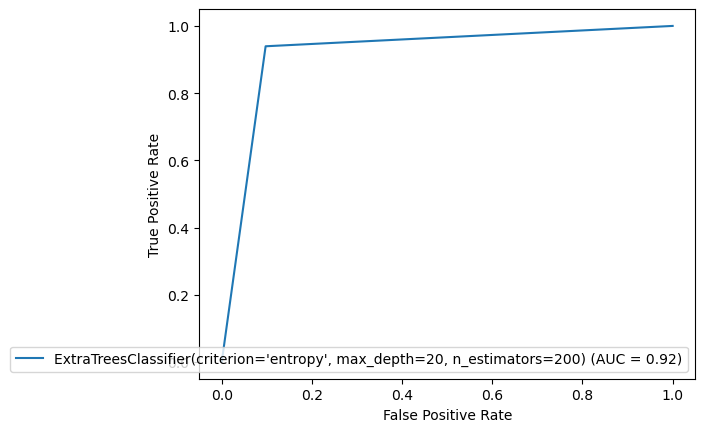

In [569]:
curve = metrics.RocCurveDisplay(fpr=fpr, tpr= tpr, roc_auc= roc_auc, estimator_name=Final_model)
curve.plot()